# Анализ продаж автомобилей в Казахстане за 2019 год для компании Mercur Auto

В датасете представлены данные о продажах новых автомобилей в Казахстане за 9 месяцев 2019 года (данные реальные, собраны статистической компанией-агрегатором). 

Необходимо проанализировать рынок автомобилей в целом (емкость, динамику, конкурентную среду) и оценить позицию автоцентра Меркур авто на рынке: анализ внешней и внутренней среды автоцентра. Данные содержат множество ошибок, поэтому перед анализом необходимо провести предобработку данных.



**Задача**


Менеджер Mercur Auto поставил задачу аналитику провести исследовательский анаиз продаж автомобилей на рынке Казахстана за 2019 год.


**Задания для работы**:

*Анализ рынка*:

- Емкость рынка автомобилей: в денежном и количественном выражении;
- Бренды лидеры на рынке автомобилей;
- Динамика рынка: общая, по сегментам;
- RFM-анализ моделей авто (показатели Frequency и Monetary);
- Продажи автомобилей в разрезе бренд / сегмент;
- Продажи по брендам;
- Продажи по регионам;
- Проверить гипотезу: стоимость автомобиля зависит от средней заработной платы по региону;
- Продажи автоцентров.

*Анализ положения Меркур Авто*:

- Выручка: общая, по брендам, средняя, ежемесячная, ежемесячная по брендам;
- Продажи по регионам: общие, по брендам;
- Конкурентный анализ.



**Описание датасета:**

- Год – год продажи (2019)
- Месяц – месяц продажи (январь - сентябрь)
- Компания – название автоцентра
- Бренд – название продаваемой марки автомобиля
- Модель – название модели автомобиля
- Модификация – модификация модели автомобиля
- Год выпуска – год производства автомобиля
- Страна-производитель – страна, где произведен автомобиль
- Вид топлива – бензин, дизель, электричество, гибрид
- Объём двиг л – объем двигателя автомобиля в литрах
- Коробка передач – тип коробки переключения передач
- Тип привода
- Сегмент – сегмент, к которому относится авто
- Регион – регион продажи
- Наименование дилерского центра
- Тип клиента – юридическое или физическое лицо
- Форма расчета – наличный и безналичный расчет
- Количество – количество автомобилей в заказе
- Цена USD – цена автомобиля
- Продажа USD – цена заказа
- Область – область продажи
- Сегментация 2013 – сегмент автомобиля актуальный
- Класс 2013 – класс автомобиля актуальный
- Сегментация Eng – английская сегментация
- Локализация производства – удаляем

**Ход исследования**:
- Откроем файлы с данными и изучим общую информацию.
- Подготовим данные
- Преобразуем данные в нужные типы;
- Проверим наличие дубликатов;
- Обработаем пропуски и при необходимости заменим;
- Исследуем данные и построим графики
- Проверим гипотезу
- Проведем анализ рынка авто Казахстана
- Проведем анализ Mercur Auto



## Откроем файл с данными и посмотрим общую информацию

In [349]:
# импорт библиотек
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import squarify
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from pywaffle import Waffle
import statistics as st
import scipy
from scipy import stats as st
import math
from collections import Counter
import yadisk
import os


import warnings

%matplotlib inline

In [350]:
from IPython.display import HTML, display
from tabulate import tabulate

In [351]:
# отключим предупреждения
warnings.filterwarnings('ignore')

In [352]:
# настройка отображения количества столбцов и знаков десятичных разрядов
pd.set_option('display.max_columns', 30)
pd.set_option('display.float_format', '{:.2f}'.format)
pd.options.display.max_colwidth = 500

In [353]:
# подключаемся к яндекс диску
y = yadisk.YaDisk(app_id, secret_id, ya_token)

In [354]:
y.check_token()

True

In [355]:
# скачиваем нужный файл
y.download('/analyst_kaz/auto_kz_2019.csv', 'auto_kz_2019.csv')

<SyncResourceLinkObject{'href': 'https://cloud-api.yandex.net/v1/disk/resources?path=disk%3A%2Fanalyst_kaz%2Fauto_kz_2019.csv', 'method': 'GET', 'templated': False, 'path': 'disk:/analyst_kaz/auto_kz_2019.csv', 'public_key': None, 'public_url': None, 'type': None, 'file': None}>

In [356]:
# прочтем файл
df = pd.read_csv('auto_kz_2019.csv', sep=';', decimal=',')

In [357]:
df.sample(5)

,Год,Месяц,Компания,Бренд,Модель,Модификация,Год выпуска,Страна-производитель,Вид топлива,"Объём двиг, л,",Коробка передач,Тип привода,Сегмент,Регион,Наименование дилерского центра,Тип клиента,Форма расчета,Количество,"Цена, USD","Продажа, USD",Область,Сегментация 2013,Класс 2013,Сегментация Eng,Локализация производства
20888,2019,Февраль,Nissan Manufacturing RUS,Nissan,Qashqai,SE,2018,Российская Федерация,Бензин,"1,2",CVT,Передний,NaN,Актобе,Кол Авто,NaN,NaN,1.00,18882.30,18882.30,Актюбинская область,Внедорожники,Компактные SUV,K1,Импорт
35384,2019,Май,Toyota Motor Kazakhstan,Toyota,LC200,C5,2019,Япония,Бензин,"4,6",AT,4WD,Полноразмерные SUV,Шымкент,Тойота Центр Шымкент,Физ. Лицо,NaN,1.00,71181.61,71181.61,Южно-Казахстанская область,Внедорожники,Полноразмерные SUV,K3,Импорт
38790,2019,Январь,Eurasia Motor Premium,Cadillac,Escalade,Luxury,2018,США,Бензин,"6,2",8AT,4WD,premium SUV,Алматы,Cadillac Almaty,Физ. Лицо,NaN,1.00,71356.96,71356.96,г.Алматы,Внедорожники,Полноразмерные SUV,K3,Импорт
10428,2019,Март,Astana Motors,Hyundai,Tucson,Hyundai Tucson ix35 FL Comfort,2019,Республика Казахстан,Бензин,2,6 AT,2 WD,C-SUV,Нур-Султан,HYUNDAI AUTO ASTANA,Физ. Лицо,NaN,1.00,24111.41,24111.41,г.Нур-Султан,Внедорожники,Компактные SUV,K1,Локальное производство
9441,2019,Май,Astana Motors,Hyundai,Sonata,Hyundai Sonata LF Style,2019,Республика Казахстан,Бензин,2,6 AT,2 WD,D,Алматы,Hyundai Premium Almaty,Физ. Лицо,кредит,1.00,28393.70,28393.70,г.Алматы,Легковые автомобили,D класс,D,Локальное производство


In [358]:
start_shape = df.shape
print(f'Итого {start_shape[0]} наблюдений с {start_shape[1]} признаками')

Итого 39966 наблюдений с 25 признаками


In [359]:
# скопируем датафрей для дальнейшей работы с ним
auto = df.copy()

In [360]:
# удалим столбцы, которые далее в анализе не будут учитываться
auto.drop(['Сегмент', 'Модификация', 'Форма расчета', 'Сегментация Eng', 'Локализация производства',\
           'Наименование дилерского центра'], axis= 1 , inplace= True)

In [361]:
# заменим столбцы
# создаем список из текущих колонок
columns_start = auto.columns.tolist()

In [362]:
# создаем список новых названий колонок
columns_end = ['year', 'month', 'company', 'brand', 'model', 'release_year', 'manufacturing_country', 'fuel_type',
         'engine_volume', 'transmission', 'drive_type', 'region', 'client_type', 'quantity',
         'price_usd', 'sell_price_usd', 'state', 'segment_2013', 'class_2013']

In [363]:
# создаем словарь со старыми и новыми значениями передав методу dict zip объект
change_col_dict = dict(zip(columns_start, columns_end))

In [364]:
change_col_dict

{'Год': 'year',
 'Месяц': 'month',
 'Компания': 'company',
 'Бренд': 'brand',
 'Модель': 'model',
 'Год выпуска': 'release_year',
 'Страна-производитель': 'manufacturing_country',
 'Вид топлива': 'fuel_type',
 'Объём двиг, л,': 'engine_volume',
 'Коробка передач': 'transmission',
 'Тип привода': 'drive_type',
 'Регион': 'region',
 'Тип клиента': 'client_type',
 'Количество': 'quantity',
 'Цена, USD': 'price_usd',
 'Продажа, USD': 'sell_price_usd',
 'Область': 'state',
 'Сегментация 2013': 'segment_2013',
 'Класс 2013': 'class_2013'}

In [365]:
# меняем названия колонок через метод rename
auto = auto.rename(columns=change_col_dict)

In [366]:
# проверяем
auto.sample(5)

,year,month,company,brand,model,release_year,manufacturing_country,fuel_type,engine_volume,transmission,drive_type,region,client_type,quantity,price_usd,sell_price_usd,state,segment_2013,class_2013
15354,2019,Июнь,ТК КАМАЗ,KAMAZ,45143,2019,Республика Казахстан,Дизель,NaN,MT,NaN,Актау,Юр. Лицо,1.00,43977.02,43977.02,Мангистауская область,Коммерческие автомобили,Крупнотоннажные грузовики
22251,2019,Июнь,Равон Моторс Казахстан,Ravon,Nexia R3,2019,Республика Казахстан,Бензин,NaN,NaN,NaN,Актау,Физ. Лицо,1.00,10015.24,10015.24,Мангистауская область,Легковые автомобили,B класс
32922,2019,Июнь,Toyota Motor Kazakhstan,Toyota,HILUX DC,2019,Таиланд,Бензин,2.7,5MT,4WD,Алматы,Юр. Лицо,1.00,30940.98,30940.98,г.Алматы,Пикапы,Pick-ups
28388,2019,Май,Toyota Motor Kazakhstan,Toyota,Camry,2019,Российская Федерация,Бензин,"2,5",AT,FF,Нур-Султан,Физ. Лицо,1.00,26946.38,26946.38,г.Нур-Султан,Легковые автомобили,D класс
20994,2019,Май,Nissan Manufacturing RUS,Nissan,Qashqai,2019,Российская Федерация,Бензин,"1,2",CVT,4WD,Алматы,NaN,1.00,26762.18,26762.18,г.Алматы,Внедорожники,Компактные SUV


In [367]:
# посмотрим и расчитаем пропуски и уникальные значения
# создадим пустые списки
columns = []
type_list = []
null_ratio = []
unique_cnt = []
unique_names = []

# создадим цикл, который добавит значения в списки

for i in auto.columns:
    columns.append(i)
    type_list.append(auto[i].dtypes)
    null_ratio.append(f'{(100 * auto[i].isnull().sum() / len(auto[i])):.2f}' + '%')
    unique_cnt.append(auto[i].nunique())
    unique_names.append(auto[i].unique())

auto_null = pd.DataFrame({'columns': columns,
                          'columns_type': type_list,
                          'null_ratio': null_ratio,
                          'unique_cnt': unique_cnt,
                          'unique_names': unique_names
                         })

auto_null

,columns,columns_type,null_ratio,unique_cnt,unique_names
0,year,int64,0.00%,1,[2019]
1,month,object,0.00%,9,"[Май, Август, Апрель, Июль, Февраль, Июнь, Сентябрь, Январь, Март]"
2,company,object,0.00%,40,"[Mercur Auto, Автоцентр-Бавария, БИПЭК АВТО, Вираж, Eurasia Motor Premium, Daewoo Bus Kazakhstan, Caspian Motors, Каспиан Моторс, СемАЗ, Astana Motors, Astana Motors , Hyundai Com Trans Kazakhstan , Nissan Manufacturing RUS, СВС-ТРАНС, Allur Auto, Almaty Motors Premium, TERRA MOTORS, ТК КАМАЗ, Toyota Motor Kazakhstan, Лифан Моторс Рус, MAN Truck & Bus Kazakhstan, Автомир ГК, Autokapital, Автокапитал, ММС Рус, MMC RUS, Mercur Autos, УзАвто-Казахстан, Равон Моторс Казахстан, Ravon Motors Kazak..."
3,brand,object,0.00%,46,"[Audi, BMW, Chevrolet, Daewoo, Ford, Foton, GAZ, Hyundai, Hyundai Truck & Bus, Infiniti, Isuzu, Iveco, Jac, Jaguar, KAMAZ, Kia, Lada, Land Rover, Lexus, Lifan, MAN, Mazda, Mercedes-Benz, Mercedes-Benz Trucks, Mini, Mitsubishi, Nissan, Peugeot, Porsche, Ravon, Renault, Scania, Skoda, Subaru, Toyota, UAZ, Volkswagen, Volvo, Урал, Cadillac, Shacman, Hino, Dong Feng, ANKAI, Nefaz, Yutong]"
4,model,object,0.00%,273,"[A3, A4, A6, A7, A8, Q5, Q7, 3 серия, 5 серия, 6 серия, 7 серия, X1, X3, X4, X5, X6, X7, Z4, Aveo, Captiva, Niva, Tahoe, Tracker, BS 106 A, Fiesta, Mondeo, BJ3253DMPKB-AD, 2217, 2310, 2705, 2752, 3221, 3302, 3308, 3309, Next, Accent, Creta, Elantra, Santa Fe, Sonata, TQ-1/H-1, County, H350, HD 160, HD 170, HD 65, HD 78, Universe, Tucson, Q50, QX50, QX60, QX80, D-MAX, NMR, NPR, Daily, Daily A, Daily V, Stralis, Tipper, S3, S5, F-Pace, F-Type, XE, XF, XJ, 4308, 4311, 43118, 43253, 43502, 44108..."
5,release_year,object,1.25%,9,"[2018, 2017, 2019, nan, 2016, 2014, 2013, 2011, 2 018, 2 019]"
6,manufacturing_country,object,0.00%,19,"[Германия, США, Австрия, Республика Казахстан, Российская Федерация, Корея, Япония, Таиланд, Китай, UK, Узбекистан, Венгрия, Турция, Испания, Нидерланды, Польша, Швеция, Белоруссия, Бельгия]"
7,fuel_type,object,7.86%,10,"[Бензин, Дизель, nan, дизель , бензин , гибрид, 2, 1,6, 0, Электро, Электричество]"
8,engine_volume,object,10.65%,114,"[1,4, 2, 3, 4,4, 6,6, 1,5, 1,596, 2,4, 1,7, 26,7, 25,7, 24,7, 23,7, 22,7, 21,7, 20,7, 19,7, 18,7, 17,7, 16,7, 15,7, 14,7, 13,7, 12,7, 11,7, 10,7, 9,7, 8,7, 7,7, 6,7, 5,7, 4,7, 3,7, 2,7, 6,2, 1,4 Turbo, 2,5, 1,6, nan, 2,8, 4,3, 4,3,, 1,6 MPI, 2,0 MPI, 2,4 GDI, 2,4 MPI, 2,5 CRDI VGT, 2,5 CRDI WGT, 3,9, 7,5, 12,3, 1,6 T-GDI, 2,0 CRDI, 2.0, 3,5, 5,6, 5,2, 3,0 L, 1.6, 1.5, 5, 1,598, 1,248, 1,998, 2,359, 1,999, 3,342, 1,591, 3,47, 1,69, 1,774, 2.5, 2.7 , 3.5, 2.7, 4.6, 4,6, 5.7, 1,8, 10,5, 4, 5,5,..."
9,transmission,object,8.14%,83,"[S-tronic, S-Tronic, Tiptronic, АКПП, АКП, Steptronic, AT, 6 АТ, 5 МТ, 6АТ, MT, 8AT, 5МТ, Powershift S6, 6AT, nan, Мех., 6 AT, 6 MT, 6MT, 5 AT, 5AT, МКПП, 7 DCT, 7DCT, 8 AT, МТ, CVT, DCT, 4 АТ, 6 МТ, 6МТ, 4АТ, 4AT, 8АТ, 8 АТ, 5MT, AMT, CVT (вариатор), CVT (вариATор), CVT(вAриATор), 7G-TRONIC, 9G-TRONIC, 12AT, 12АТ, 5АТ, 7АТ, 7AT, 6M/T, PDK, 8-ступ АКПП, 8, 8АКПП, 8 АКПП Tiptronic S, 7 АКПП (PDK), 7 АКПП PDK, 8 АКПП (PDK), АТ, АT, МT, 4WD, Передний, 0, 7 DSG, 7DSG, 6 DSG, 6DSG, #Н/Д, DSG, 6A,..."


In [368]:
# пропущенные значения в виде графика

def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), legend = False, fontsize = 16)
            .set_title('Пропуски в столбцах в процентах' + "\n", fontsize = 20)
        );
    except:
        print('Пропусков нет или произошла ошибка в первой части функции ')

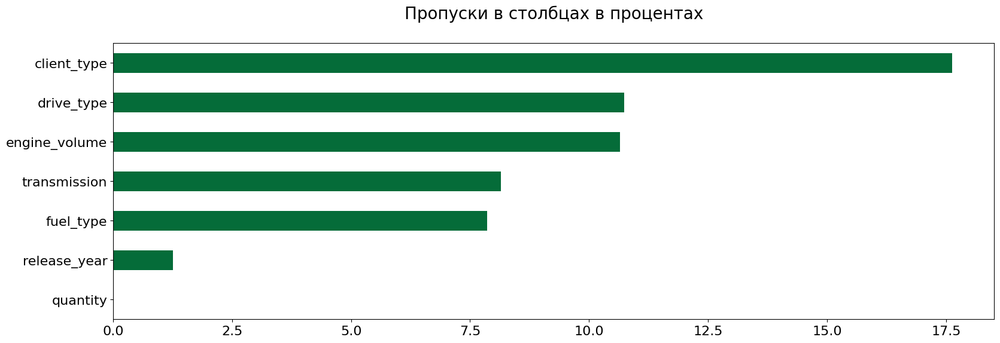

In [369]:
pass_value_barh(auto)

*Комментарий*

В семи столбцах нашли пропушенные значения. Наибольший процент пропусков в столбце - тип клиента.

## Предобработаем данные

### Предобработка столбца месяц/month

In [370]:
# посмотрим уникальные значения
auto.month.unique()

array(['Май', 'Август', 'Апрель', 'Июль', 'Февраль', 'Июнь', 'Сентябрь',
       'Январь', 'Март'], dtype=object)

In [371]:
# переведем месяцы в числа
auto.month = auto.month.map({'Май': '05',
                             'Август': '08',
                             'Апрель': '04',
                             'Июль': '07',
                             'Февраль': '02',
                             'Июнь': '06',
                             'Сентябрь': '09',
                             'Январь': '01',
                             'Март': '03'})

In [372]:
# создадим столбец с месяцем и годом продаж
auto['sales_data'] = auto.year.astype('str') + '-' + auto.month


In [373]:
# меняем тип на дата
auto['sales_data'] = pd.to_datetime(auto.sales_data, format='%Y-%m').dt.date

In [374]:
# проверим
auto.sales_data.unique()

array([datetime.date(2019, 5, 1), datetime.date(2019, 8, 1),
       datetime.date(2019, 4, 1), datetime.date(2019, 7, 1),
       datetime.date(2019, 2, 1), datetime.date(2019, 6, 1),
       datetime.date(2019, 9, 1), datetime.date(2019, 1, 1),
       datetime.date(2019, 3, 1)], dtype=object)

*Комментарий*

Поменяли значения месяцев и создали новый столбец sales_data с годом и месяцем продаж.

### Предобработка столбца компания/company

In [375]:
# убираем пробелы
auto['company'] = auto['company'].str.strip()

In [376]:
# приведем названия компаний к единому, убрав задвоенность на русском и английском
auto = (auto.replace
 (
     {'company' :
      {'Каспиан Моторс':'Caspian Motors',
       'Автокапитал':'Autokapital',
       'ММС Рус':'MMC RUS',
       'Mercur Autos':'Mercur Auto',
       'Равон Моторс Казахстан':'Ravon Motors Kazakstan',
       'Хино Моторс Казахстан':'Hino Motors'}
     }
 )
)

In [377]:
# посмотрим количество продаж каждой компании
auto['company'].value_counts()

Toyota Motor Kazakhstan         11951
Astana Motors                   10169
БИПЭК АВТО                       3624
Вираж                            2909
Allur Auto                       2526
Renault Россия                   1796
Ravon Motors Kazakstan           1506
Nissan Manufacturing RUS         1149
ТК КАМАЗ                          893
Mercur Auto                       643
Subaru Kazakhstan                 503
MMC RUS                           410
Лифан Моторс Рус                  233
Автоцентр-Бавария                 224
СВС-ТРАНС                         202
Hyundai Com Trans Kazakhstan      155
УзАвто-Казахстан                  152
Autokapital                       118
Автомир ГК                        112
Volkswagen Group Rus              109
Eurasia Motor Premium             102
Almaty Motors Premium              94
СемАЗ                              93
TERRA MOTORS                       77
Автодом Motors KST                 53
Scandinavian Motors                42
Hino Motors 

*Комментарий*

Для столбца company, убрали пробелы в начале и конце названия. Переименовали задвоеные названия компаний на русском и английском. Посмотрели сколько у каждой компании продаж.

### Предобработка столбца модель/model

In [378]:
# посмотрим уникальные значения
auto.model.unique()

array(['A3', 'A4', 'A6', 'A7', 'A8', 'Q5', 'Q7', '3 серия', '5 серия',
       '6 серия', '7 серия', 'X1', 'X3', 'X4', 'X5', 'X6', 'X7', 'Z4',
       'Aveo', 'Captiva', 'Niva', 'Tahoe', 'Tracker', 'BS 106 A',
       'Fiesta', 'Mondeo', 'BJ3253DMPKB-AD', '2217', '2310', '2705',
       '2752', '3221', '3302', '3308', '3309', 'Next', 'Accent', 'Creta',
       'Elantra', 'Santa Fe', 'Sonata', 'TQ-1/H-1', 'County', 'H350',
       'HD 160', 'HD 170', 'HD 65', 'HD 78', 'Universe', 'Tucson', 'Q50',
       'QX50', 'QX60', 'QX80', 'D-MAX', 'NMR', 'NPR', 'Daily', 'Daily A',
       'Daily V', 'Stralis', 'Tipper', 'S3', 'S5', 'F-Pace', 'F-Type',
       'XE', 'XF', 'XJ', '4308', '4311', '43118', '43253', '43502',
       '44108', '45142', '45143', '53215', '53504', '53605', '54115',
       '5490', '65111', '65115', '65116', '65117', '6520', '65206',
       '65225', '66052', '6606', 'Cerato', 'Optima', 'Picanto', 'Quoris',
       'Rio', 'Sorento', 'Soul', 'Sportage', '4x4', 'Granta', 'Kalina',
       '

In [379]:
# для стобца модель уберем пробелы
auto['model'] = auto['model'].str.strip()

*Комментарий*

Для столбца model, убрали пробелы в начале и конце названия модели.

### Предобработка столбца бренд/brand

In [380]:
# посмотрим уникальные значения
auto.brand.unique()

array(['Audi', 'BMW', 'Chevrolet', 'Daewoo', 'Ford', 'Foton', 'GAZ',
       'Hyundai', 'Hyundai Truck & Bus', 'Infiniti', 'Isuzu', 'Iveco',
       'Jac', 'Jaguar', 'KAMAZ', 'Kia', 'Lada', 'Land Rover', 'Lexus',
       'Lifan', 'MAN', 'Mazda', 'Mercedes-Benz', 'Mercedes-Benz Trucks',
       'Mini', 'Mitsubishi', 'Nissan', 'Peugeot', 'Porsche', 'Ravon',
       'Renault', 'Scania', 'Skoda', 'Subaru', 'Toyota', 'UAZ',
       'Volkswagen', 'Volvo', 'Урал', 'Cadillac', 'Shacman', 'Hino',
       'Dong Feng', 'ANKAI', 'Nefaz', 'Yutong'], dtype=object)

*Комментарий*

С эти столбцом все впорядке.

### Предобработка столбца год выпуска/release_year

In [381]:
auto.release_year.unique()

array(['2018', '2017', '2019', nan, '2016', '2014', '2013', '2011',
       '2\xa0018', '2\xa0019'], dtype=object)

*Комментарий*

В данных есть скрытый пробел 2\xa0018 и 2\xa0019, так как данные выгружались с Excel. Так же есть пропуски.

In [382]:
# преведем года к единому названию. Выгружая данные из Excel, названия выгрузились с ошибкой
auto = (auto.replace
 (
     {'release_year' :
      {'2\xa0018':'2018',
       '2\xa0019':'2019'
       }
     }
 ))

In [383]:
# посмотрим пропущеные значения в столбце
auto['release_year'].isna().sum()

501

In [384]:
# посмотрим у каких моделей отсутствует год выпуска
auto[auto['release_year'].isna()]['model'].unique()

array(['7 серия', 'H350', 'HD 160', 'HD 65', 'HD 78', 'Universe', 'S3',
       'S5', 'XJ', 'Discovery Sport', 'Range Rover', 'Range Rover Evoque',
       'Range Rover Sport', '3', '6', 'CX-5', 'Outlander', 'Pajero IV',
       'Pajero Sport', 'Nexia R3', 'Amarok', 'Caravelle', 'Polo',
       'Tiguan', 'Touareg', 'Transporter Kasten', 'XC90', 'CX-9', 'HD 35',
       'Range Rover Velar', 'E-PACE', 'Eclipse Cross', 'XC60', 'Teramont',
       'EX8'], dtype=object)

In [385]:
# заполним пропущеные данные модой ориентируясь на модель авто
auto.release_year = auto.groupby('model')['release_year']\
.transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [386]:
# посмотрим сколько пропущенных значений осталось
auto['release_year'].isna().sum()

6

In [387]:
auto[auto['release_year'].isna()]

,year,month,company,brand,model,release_year,manufacturing_country,fuel_type,engine_volume,transmission,drive_type,region,client_type,quantity,price_usd,sell_price_usd,state,segment_2013,class_2013,sales_data
9631,2019,07,Hyundai Com Trans Kazakhstan,Hyundai Truck & Bus,HD 160,NaN,Республика Казахстан,NaN,NaN,NaN,NaN,Алматы,Юр. Лицо,1.00,34000.00,34000.00,г.Алматы,Коммерческие автомобили,Среднетоннажные грузовики,2019-07-01
20223,2019,02,Автомир ГК,Mazda,3,NaN,Российская Федерация,NaN,NaN,NaN,NaN,Караганда,NaN,1.00,21547.26,21547.26,Карагандинская область,Легковые автомобили,C класс,2019-02-01
20224,2019,02,Автомир ГК,Mazda,3,NaN,Российская Федерация,NaN,NaN,NaN,NaN,Нур-Султан,NaN,1.00,21547.26,21547.26,г.Нур-Султан,Легковые автомобили,C класс,2019-02-01
20225,2019,03,Автомир ГК,Mazda,3,NaN,Российская Федерация,NaN,NaN,NaN,NaN,Караганда,NaN,1.00,21596.82,21596.82,Карагандинская область,Легковые автомобили,C класс,2019-03-01
20226,2019,03,Автомир ГК,Mazda,3,NaN,Российская Федерация,NaN,NaN,NaN,NaN,Нур-Султан,NaN,1.00,21596.82,21596.82,г.Нур-Султан,Легковые автомобили,C класс,2019-03-01
20227,2019,03,Автомир ГК,Mazda,3,NaN,Российская Федерация,NaN,NaN,NaN,NaN,Нур-Султан,NaN,1.00,21596.82,21596.82,г.Нур-Султан,Легковые автомобили,C класс,2019-03-01


In [388]:
# посмотрим часто встречающийся год выпуска для бренда Hyundai Truck & Bus
auto[auto['brand'] == 'Hyundai Truck & Bus']['release_year'].value_counts()

2019    92
2017    52
2018     9
2013     1
Name: release_year, dtype: int64

In [389]:
# посмотрим часто встречающийся год выпуска для бренда Mazda
auto[auto['brand'] == 'Mazda']['release_year'].value_counts()

2019    96
2018    11
Name: release_year, dtype: int64

In [390]:
# заменим для оставшихся пропусков занчения на моду по бренду
auto.release_year = auto.groupby('brand')['release_year']\
.transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [391]:
# посмотрим сколько пропущенных значений осталось
auto['release_year'].isna().sum()

0

In [392]:
# поменяем тип на число
auto['release_year'] = auto['release_year'].astype('int16')

*Комментарий*

Для столбца release_year: переименовали не корректно отраженные года выпуска; нашли пропуски и заменили их модой, ориентируясь на модель и бренд авто.

### Предобработка столбца manufacturing_country

Для перекодировки стран в Alpha3, воспользуемся данными с [сайта Артемия Лебедева](https://www.artlebedev.ru/country-list/)  

In [393]:
# извлечем данные с кодировкой сайта
type(pd.read_html('https://www.artlebedev.ru/country-list/', encoding = 'utf8')[0])


pandas.core.frame.DataFrame

In [394]:
# создадим датасет с кодами стран с сайта Лебедева
countries_codes = (pd.read_html('https://www.artlebedev.ru/country-list/', encoding='utf8')[0]
                   [['Наименование', 'Полное наименование', 'Alpha3']]
                   .rename(columns={'Наименование':'name', 'Полное наименование':'full_name'})
                  )


In [395]:
# создадим словарь для замены названий
# цикл пройдется по названиям стран и заменит на код
countries_codes_dict = {}
for i in range(len(countries_codes)):
        if countries_codes.loc[i]['name'] not in countries_codes_dict:
            countries_codes_dict[countries_codes.loc[i]['name']] = countries_codes.loc[i]['Alpha3']
        if countries_codes.loc[i]['full_name'] not in countries_codes_dict:
            countries_codes_dict[countries_codes.loc[i]['full_name']] = countries_codes.loc[i]['Alpha3']


In [396]:
# заменим по словарю значения
auto.manufacturing_country = auto.manufacturing_country.apply(lambda cell: countries_codes_dict.get(cell, cell))


In [397]:
# проверяем
auto.manufacturing_country.unique()

array(['DEU', 'США', 'AUT', 'KAZ', 'RUS', 'Корея', 'JPN', 'THA', 'CHN',
       'UK', 'UZB', 'HUN', 'TUR', 'ESP', 'NLD', 'POL', 'SWE',
       'Белоруссия', 'BEL'], dtype=object)

Три страны не смогли заменить на код Alpha3

In [398]:
# создадим новый словарь
codes_dict_new = countries_codes_dict

In [399]:
# заменим ключи
codes_dict_new['Белоруссия'] = codes_dict_new.pop('Беларусь')
codes_dict_new['США'] = codes_dict_new.pop('Соединенные Штаты')
codes_dict_new['Корея'] = codes_dict_new.pop('Корея, Республика')


In [400]:
# снова произведем замену названий на код
auto.manufacturing_country = auto.manufacturing_country.apply(lambda cell: codes_dict_new.get(cell, cell))


In [401]:
# проверяем получившийся результат
auto.manufacturing_country.unique()

array(['DEU', 'USA', 'AUT', 'KAZ', 'RUS', 'KOR', 'JPN', 'THA', 'CHN',
       'UK', 'UZB', 'HUN', 'TUR', 'ESP', 'NLD', 'POL', 'SWE', 'BLR',
       'BEL'], dtype=object)

*Комментарий*

Провели замену названий стран на код Alpha3

### Предобработка столбца тип топлива/fuel_type

In [402]:
# посмотрим уникальные значения в столбце
auto.fuel_type.unique()

array(['Бензин', 'Дизель', nan, 'дизель ', 'бензин ', 'гибрид', '2',
       '1,6', '0', 'Электро', 'Электричество'], dtype=object)

In [403]:
# приведем все названия к единому виду
auto['fuel_type'] = auto['fuel_type'].str.capitalize()

In [404]:
# уберем пробелы
auto['fuel_type'] = auto['fuel_type'].str.strip()

In [405]:
# найдем модель для значения 2
auto[auto['fuel_type'] == '2']['model'].unique()

array(['Duster'], dtype=object)

In [406]:
# посмотрим какой вид топлива характерен для модели Duster
auto.query('model == "Duster"')['fuel_type'].unique()

array(['2', '1,6', nan, 'Бензин'], dtype=object)

In [407]:
# найдем модель для значения 1,6
auto[auto['fuel_type'] == '1,6']['model'].unique()

array(['Duster', 'Sandero'], dtype=object)

In [408]:
# посмотрим какой вид топлива характерен для модели Sandero
auto.query('model == "Sandero"')['fuel_type'].unique()

array([nan, '1,6', 'Бензин'], dtype=object)

In [409]:
# найдем модель для значения 0
auto[auto['fuel_type'] == '0']['model'].unique()

array(['3741'], dtype=object)

In [410]:
# посмотрим какой вид топлива характерен для модели 3741
auto.query('model == "3741"')['fuel_type'].unique()

array(['0', 'Бензин', nan], dtype=object)

*Комментарий*

Для моделей Renault Duster, Renault Sandero и UAZ 3741 характерный вид топлива - бензин. Произведем замену.

In [411]:
# заменим значения 2, 1.6, 0 на Бензин
auto = (auto.replace
 (
     {'fuel_type' :
      {'2':'Бензин',
       '1,6':'Бензин',
       '0':'Бензин',
       'Электро':'Электричество'
       }
     }
 ))

In [412]:
# заменим для оставшихся пропусков занчения на моду по модели
auto.fuel_type = auto.groupby(['model'])['fuel_type']\
.transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [413]:
# заменим для оставшихся пропусков занчения на моду по бренду
auto.fuel_type = auto.groupby(['brand'])['fuel_type']\
.transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [414]:
auto[auto['fuel_type'].isna()].groupby(['brand', 'model'])['fuel_type'].unique()

brand      model         
Dong Feng  BWC6665GA5        [nan]
Foton      BJ1069VDJEA-F1    [nan]
           BJ3253DMPKB-AD    [nan]
Mazda      3                 [nan]
           6                 [nan]
           CX-5              [nan]
           CX-9              [nan]
Shacman    SX3258DR384       [nan]
Урал       32551             [nan]
           4320              [nan]
           4320-1951-40      [nan]
           4320-1951-60      [nan]
           5557              [nan]
Name: fuel_type, dtype: object

*Комментарий*

Проверим эти модели.

Данные по авто были получены с [сайта](www.drom.ru)

    Бензин: Dong Feng BWC6665GA5, Mazda 3, Mazda 6, Mazda CX-5, Mazda CX-9.

    Дизель: Foton BJ1069VDJEA-F1, Foton BJ3253DMPKB-AD, Shacman SX3258DR384, Урал 32551, Урал 4320, Урал 4320-1951-40, Урал  4320-1951-60, Урал 5557.

In [415]:
brand_diesel = ['Урал', 'Shacman', 'Foton']
brand_petrol = ['Mazda', 'Dong Feng']

In [416]:
# заполним пропуски найдеными данными для каждого бренда
auto.loc[auto.brand.isin(brand_diesel), 'fuel_type'] = 'Дизель'

In [417]:
# заполним пропуски найдеными данными для каждого бренда
auto.loc[auto.brand.isin(brand_petrol), 'fuel_type'] = 'Бензин'

In [418]:
# посмотрим сколько пропущенных значений осталось
auto.fuel_type.isna().sum()

0

In [419]:
# проверим количество авто с определенным выидом топлива
auto.fuel_type.value_counts()

Бензин           37771
Дизель            2171
Электричество       14
Гибрид              10
Name: fuel_type, dtype: int64

*Комментарий*

Для столбца fuel_type была сделана предобработка: привели к единому регистру, убрали пропуски, перименовали некорректные значения (предварительно найдя для моделей Renault Duster, Renault Sandero и UAZ 3741 характерный вид топлива - бензин), заменили оставшиеся пропуски модой по моделе и бренду. Для тех моделей, что не смогли заменить модой, нашли данные на [сайте Дром.ру](www.drom.ru) и заполнили пропуски.

### Предобработка столбца объем двигателя/engine_volume

In [420]:
# посмотрим уникальные значения столбца
auto.engine_volume.unique()

array(['1,4', '2', '3', '4,4', '6,6', '1,5', '1,596', '2,4', '1,7',
       '26,7', '25,7', '24,7', '23,7', '22,7', '21,7', '20,7', '19,7',
       '18,7', '17,7', '16,7', '15,7', '14,7', '13,7', '12,7', '11,7',
       '10,7', '9,7', '8,7', '7,7', '6,7', '5,7', '4,7', '3,7', '2,7',
       '6,2', '1,4 Turbo', '2,5', '1,6', nan, '2,8', '4,3', '4,3,',
       '1,6 MPI', '2,0 MPI', '2,4 GDI', '2,4 MPI', '2,5 CRDI VGT',
       '2,5 CRDI WGT', '3,9', '7,5', '12,3', '1,6 T-GDI', '2,0 CRDI',
       '2.0', '3,5', '5,6', '5,2', '3,0 L', '1.6', '1.5', '5', '1,598',
       '1,248', '1,998', '2,359', '1,999', '3,342', '1,591', '3,47',
       '1,69', '1,774', '2.5', '2.7 ', '3.5', '2.7', '4.6', '4,6', '5.7',
       '1,8', '10,5', '4', '5,5', '12', '12,8', '11', '2,2', '1,2',
       '1,485', 'MT', 'AT', '0', '13', '1,33', '#Н/Д', '4.0', '2.4G',
       '2,4G', '2.8', '2,693', '2,0', '3,8', '3.8', '1,2T', '3,6', '7,6',
       '4,9', '2.0h', '2,9', '400 Л.С.', '4,98 L,', '4,98', '88 KWH',
       '8,4 L,', 

In [421]:
# проверим модель для значения 400 Л.С.
auto.loc[auto.engine_volume == '400 Л.С.']['model'].unique()

array(['I-Pace'], dtype=object)

In [422]:
# проверим модель для значения 88 KWH
auto.loc[auto.engine_volume == '88 KWH']['model'].unique()

array(['HFF6124G03EV3'], dtype=object)

In [423]:
# проверим модель для значения #Н/Д
auto.loc[auto.engine_volume == '#Н/Д']['model'].unique()

array(['Corolla', 'HILUX DC'], dtype=object)

In [424]:
# проверим модель для значения MT
auto.loc[auto.engine_volume == 'MT']['model'].unique()

array(['Duster', 'Sandero'], dtype=object)

In [425]:
# проверим модель для значения AT
auto.loc[auto.engine_volume == 'AT']['model'].unique()

array(['Duster'], dtype=object)

In [426]:
# проверим модель для значения 0
auto.loc[auto.engine_volume == '0']['model'].unique()

array(['Sandero'], dtype=object)

In [427]:
auto.loc[auto.model == 'Duster']['engine_volume'].value_counts()

AT     20
2      19
MT     12
1,6     6
Name: engine_volume, dtype: int64

In [428]:
auto.loc[auto.model == 'Sandero']['engine_volume'].value_counts()

0      3
MT     2
1,6    1
Name: engine_volume, dtype: int64

In [429]:
# проверим  значения превышающие 10 литров
auto.loc[auto.engine_volume == '15,7']['model'].unique()

array(['Niva'], dtype=object)

In [430]:
# проверим  значения превышающие 10 литров
auto.loc[auto.engine_volume == '24,7']['model'].unique()

array(['Niva'], dtype=object)

In [431]:
auto.loc[auto.model == 'Niva']['engine_volume'].value_counts()

1,7     542
26,7      1
3,7       1
4,7       1
5,7       1
6,7       1
7,7       1
8,7       1
9,7       1
10,7      1
11,7      1
12,7      1
13,7      1
14,7      1
15,7      1
16,7      1
17,7      1
18,7      1
19,7      1
20,7      1
21,7      1
22,7      1
23,7      1
24,7      1
25,7      1
2,7       1
Name: engine_volume, dtype: int64

*Комментарий*

В данных для моделей I-Pace и HFF6124G03EV3 вместо объема двигателя указана мощность: в лошадиных силах
и киловаттах в час. Данные модели являются электромобиль, мы не можем определить для них объем двигателя, поставим заглушку - 111.

Для моделей Corolla и HILUX DC, Sandero на [сайте Дром.ру](www.drom.ru) была найдена информация, что стандартный объем двигателя для них - 1.6, произведем замену. Для Duster объем двигателя варьируется от 1.5 до 2.0, в наших данных чаще встречается 2.0, заменим на 2.0.

Значения в столбце 26.7 , 25.7 , 24.7 , 23.7 , 22.7 , 21.7 , 20.7 , 19.7 , 18.7 , 17.7 , 16.7 , 15.7 , 14.7 , 13.7 , 12.7 , 11.7 , 10.7 , 9.7 , 8.7 , 7.7 , 6.7 , 5.7 , 4.7 , 3.7 , 2.7 принадлежат Chevrolet Niva, проведем замену на 1.7

In [432]:
# посмотрим топ модели по количеству пропусков
auto[auto.engine_volume.isna()].model.value_counts().nlargest(15)

Duster      650
Sandero     435
Nexia R3    361
Logan       320
65115       259
Kaptur      230
43118       188
S3          175
3302        127
S5          117
6520         74
Next         71
NMR          68
45143        62
Arkana       55
Name: model, dtype: int64

In [433]:
# ставим заглушку для I-Pace
auto.loc[auto.engine_volume == '400 Л.С.', 'engine_volume'] = 111

In [434]:
# ставим заглушку для HFF6124G03EV3
auto.loc[auto.engine_volume == '88 KWH', 'engine_volume'] = 111

In [435]:
# заменим занчение #Н/Д на 1.6
auto.loc[auto.engine_volume == '#Н/Д', 'engine_volume'] = 1.6

In [436]:
# заменим занчение объема двигателя для Sandero
auto.loc[auto.model == 'Sandero', 'engine_volume'] = 1.6

In [437]:
# заменим занчение объема двигателя для Duster
auto.loc[auto.model == 'Duster', 'engine_volume'] = 2.0

In [438]:
# заменим занчение объема двигателя для Niva
auto.loc[auto.model == 'Niva', 'engine_volume'] = 1.7

In [439]:
# создадим функцию для очистки столбца
def engine_cleaner(cell):

    good_symbols = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '0', '.',] # список символов, которые оставляем
    new_cell = '' # новая пустая строка, куда будем добавлять "хорошие" символы
    for element in cell:
        if element in good_symbols:
            new_cell += element
    if new_cell.endswith('.'): # отдельно обработаем момент, где в конце остается точка
        new_cell = new_cell[:-1]
    return new_cell

In [440]:
# для корректной работы функции приведем столбец к типу строка
auto.engine_volume = auto.engine_volume.astype('str')

In [441]:
# произведем замену запятой на точку
auto.engine_volume = auto.engine_volume.str.replace(',', '.')

In [442]:
# применяем функцию
auto.engine_volume = auto.engine_volume.apply(engine_cleaner)

In [443]:
# проверяем
auto.engine_volume.unique()

array(['1.4', '2', '3', '4.4', '6.6', '1.5', '1.596', '2.4', '1.7', '6.2',
       '2.5', '1.6', '', '2.7', '2.8', '4.3', '2.0', '3.9', '7.5', '12.3',
       '3.5', '5.6', '8.7', '5.2', '3.0', '5', '1.598', '1.248', '1.998',
       '2.359', '1.999', '3.342', '1.591', '3.47', '1.69', '1.774', '4.6',
       '5.7', '1.8', '10.5', '4', '5.5', '12', '12.8', '11', '2.2', '1.2',
       '1.485', '13', '1.33', '4.0', '2.693', '3.8', '3.6', '7.6', '4.9',
       '2.9', '111', '4.98', '8.4', '6.7', '6.5'], dtype=object)

In [444]:
# меняем пустые значения назад на пропуски
auto.engine_volume = auto.engine_volume.replace('', np.NaN)

In [445]:
# проверяем пропуски
auto.engine_volume.isna().sum()

3173

In [446]:
# посмотрим топ модели по количеству пропусков
auto[auto.engine_volume.isna()].model.value_counts().nlargest(15)

Nexia R3    361
Logan       320
65115       259
Kaptur      230
43118       188
S3          175
3302        127
S5          117
6520         74
Next         71
NMR          68
45143        62
Arkana       55
HFF6850G     54
65116        53
Name: model, dtype: int64

In [447]:

engine_nan = auto[auto.engine_volume.isna()].model.value_counts().nlargest(15).reset_index()['index'].tolist()

In [448]:
# посмотрим наиболее частые значения объема двигателей у моделей с пропусками
auto[auto.model.isin(engine_nan)].groupby('model')['engine_volume'].value_counts()

model     engine_volume
3302      2.7               866
          2.8                 3
          4.3                 2
HFF6850G  4.98              167
          5                  19
NMR       3                  16
          8.7                 5
Nexia R3  1.5              1202
          1.485             136
Next      2.7               302
          2.8                30
          4.3                14
S3        1.6              1109
          1.5                 2
S5        2                 243
          2.0                87
Name: engine_volume, dtype: int64

*Комментарий*

Для моделей 3302, HFF6850G, NMR, Nexia R3, Next, S3, S5 можем заполнить пропуски по моде. На [сайте Дром.ру](www.drom.ru) нашла объем двигателя для модели Logan - 1.6; у модели 65115 объемдвигателя варьируется 6.7 или 11.7, можем указать любой объем, так как в дальнейшем будем категоризировать объем двигателей и по классификации они попадут в одну категорию. У модели Kaptur 1.3 или 1.6, так же можем заполнить любым значением. У модели 43118 10.8 или 11.8, заполняем любым из этих значений. У модели 6520 от 8.9 до 11.8, у модели 45143 от 6.7 до 11.8, у модели Arkana от 1.3 до 1.6, у модели 65116 от 6.7 до 11.8. В целом мы видим, что модели бренда Камаз относятся к крупнолитражным (3,6 литра и выше), можем сделать замену объема двигателя для всего бренда по моде. И для бренда Рено тоже заполнить по моде.

Для оставшихся пропусков установим заглушку - 155

Классификация объема двигателей:

    микролитражные (не больше 1,1 литра)

    малолитражные (1,2–1,7 литра)

    среднелитражные (1,8–3,5 литра)

    крупнолитражные (3,6 литра и выше).

In [449]:
# заменим для оставшихся пропусков занчения на моду по модели
auto.engine_volume = auto.groupby(['model'])['engine_volume']\
.transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [450]:
# заменим для оставшихся пропусков занчения на моду по бренду
auto.engine_volume = auto.groupby(['brand'])['engine_volume']\
.transform(lambda x: x.fillna((x.mode()[0] if not x.mode().empty else "155")))

In [451]:
# проверяем пропуски
auto.engine_volume.isna().sum()

0

In [452]:
# поменяем тип на float
auto.engine_volume = pd.to_numeric(auto.engine_volume, errors='coerce')

In [453]:
# округлим до 1 знака после точки
auto.engine_volume = auto.engine_volume.round(1)

In [454]:
# посмотрим уникальные значения
auto.engine_volume.unique()

array([  1.4,   2. ,   3. ,   4.4,   6.6,   1.5,   1.6,   2.4,   1.7,
         6.2,   2.5, 155. ,   2.7,   2.8,   4.3,   3.9,   7.5,  12.3,
         3.5,   5.6,   8.7,   5.2,   5. ,   1.2,   3.3,   1.8,   4.6,
         5.7,  10.5,   4. ,   5.5,  12. ,  12.8,  11. ,   2.2,  13. ,
         1.3,   3.8,   3.6,   7.6,   4.9,   2.9, 111. ,   8.4,   6.7,
         6.5])

In [455]:
# разодьем автомобили по категориям объема двигателя
volume_labels = ['микролитражные', 'малолитражные', 'среднелитражные', 'крупнолитражные', 'электромобиль', 'unknows']
volume_bins = [0.1, 1.1, 1.8, 3.6, 111, 155, 200]


In [456]:
# добавим столбец с категорией
auto['engine_volume_category'] = pd.cut(auto.engine_volume, bins=volume_bins, labels=volume_labels)

In [457]:
# посмотрим получившийся результат
auto.sample(5)

,year,month,company,brand,model,release_year,manufacturing_country,fuel_type,engine_volume,transmission,drive_type,region,client_type,quantity,price_usd,sell_price_usd,state,segment_2013,class_2013,sales_data,engine_volume_category
30132,2019,08,Toyota Motor Kazakhstan,Toyota,Camry,2019,RUS,Бензин,2.50,AT,FF,Алматы,Физ. Лицо,1.00,26480.34,26480.34,г.Алматы,Легковые автомобили,D класс,2019-08-01,среднелитражные
4924,2019,01,Astana Motors,Hyundai,Creta,2018,KAZ,Бензин,1.60,6 AT,2 WD,Алматы,Физ. Лицо,1.00,18737.81,18737.81,г.Алматы,Внедорожники,Субкомпактные SUV,2019-01-01,малолитражные
32809,2019,05,Toyota Motor Kazakhstan,Toyota,HILUX DC,2019,THA,Бензин,2.40,6MT,4WD,Алматы,Юр. Лицо,1.00,27280.39,27280.39,г.Алматы,Пикапы,Pick-ups,2019-05-01,среднелитражные
18182,2019,07,БИПЭК АВТО,Lada,Vesta,2019,KAZ,Бензин,1.80,5MT,Передний,Петропавловск,NaN,3.00,11600.00,34800.00,Северо-Казахстанская область,Легковые автомобили,B класс,2019-07-01,малолитражные
19002,2019,09,Toyota Motor Kazakhstan,Lexus,ES,2019,JPN,Бензин,3.50,AT,FWD,Нур-Султан,Физ. Лицо,1.00,41595.30,41595.30,г.Нур-Султан,Легковые автомобили,E класс,2019-09-01,среднелитражные


*Комментарий*

Для столбца объем двигателя была проведена следующая обработка: нашли модели авто для некорректных значений и заменили на данные с [сайта Дром.ру](www.drom.ru), поставили заглушку для электромобиль - 111, заменили пропуски модой по моделям, а затем по бренду. Для остальных пропусков поставили заглушку - 155. Создали дополнительный столбец с категоризированными данными об объеме двигателя, исходя из классификации:микролитражные (не больше 1,1 литра), малолитражные (1,2–1,7 литра), среднелитражные (1,8–3,5 литра), крупнолитражные (3,6 литра и выше).   


### Предобработка столбца тип трансмиссии/ transmission

Нам необходимо получить 2 типа коробки переключения передач: автоматическая (АТ) и механическая (МТ).


Далее для удобства анализа будем считать, что роботизированные коробки передач, редукторы, DSG и различные вариации tronic, АТ / АККП - автоматической коробкой передач. МТ / МККП – механика.


In [458]:
# убирем пробелы
auto.transmission = auto.transmission.str.upper()

In [459]:
# посмотрим уникальные значения столбца
auto.transmission.unique()

array(['S-TRONIC', 'TIPTRONIC', 'АКПП', 'АКП', 'STEPTRONIC', 'AT', '6 АТ',
       '5 МТ', '6АТ', 'MT', '8AT', '5МТ', 'POWERSHIFT S6', '6AT', nan,
       'МЕХ.', '6 AT', '6 MT', '6MT', '5 AT', '5AT', 'МКПП', '7 DCT',
       '7DCT', '8 AT', 'МТ', 'CVT', 'DCT', '4 АТ', '6 МТ', '6МТ', '4АТ',
       '4AT', '8АТ', '8 АТ', '5MT', 'AMT', 'CVT (ВАРИАТОР)',
       'CVT (ВАРИATОР)', 'CVT(ВAРИATОР)', '7G-TRONIC', '9G-TRONIC',
       '12AT', '12АТ', '5АТ', '7АТ', '7AT', '6M/T', 'PDK', '8-СТУП АКПП',
       '8', '8АКПП', '8 АКПП TIPTRONIC S', '7 АКПП (PDK)', '7 АКПП PDK',
       '8 АКПП (PDK)', 'АТ', 'АT', 'МT', '4WD', 'ПЕРЕДНИЙ', '0', '7 DSG',
       '7DSG', '6 DSG', '6DSG', '#Н/Д', 'DSG', '6A', '6А', '5M', 'A/T',
       'M/T', 'МКП', '5М', 'М/T', ' 7 АКП', '7АКП', 'А/T', '8A', 'TDI',
       '9AT', 'РЕДУКТОР'], dtype=object)

In [460]:
# проверим некорректные значения
auto[auto['transmission'] == 'POWERSHIFT S6']['model'].unique()

array(['Fiesta'], dtype=object)

In [461]:
# проверим некорректные значения
auto[auto['transmission'] == 'ПЕРЕДНИЙ']['model'].unique()

array(['Duster', 'Sandero'], dtype=object)

In [462]:
# проверим некорректные значения
auto[auto['transmission'] == '0']['model'].unique()

array(['Sandero'], dtype=object)

In [463]:
# проверим некорректные значения
auto[auto['transmission'] == '#Н/Д']['model'].unique()

array(['Corolla', 'HILUX DC'], dtype=object)

In [464]:
# проверим некорректные значения
auto[auto['transmission'] == '8']['model'].unique()

array(['Cayenne'], dtype=object)

*Комментарий*

Проверили данные модели на сайте www.drom.ru. Трансмиссия Renault Duster, Renault Sandero - механика. Ford Fiesta, Toyota HILUX DC и Corolla, Porsche Cayenne - автомат. Заменим некорректные значения.

In [465]:
list_model_at = ['HILUX DC', 'Cayenne', 'Fiesta', 'Corolla']
list_model_mt = ['Sandero', 'Duster']

In [466]:
# заменим некорректные данные на уточненые
auto.loc[auto.model.isin(list_model_at), 'transmission'] = 'АТ'

In [467]:
# заменим некорректные данные на уточненые
auto.loc[auto.model.isin(list_model_mt), 'transmission'] = 'MT'

In [468]:
auto.loc[auto.model.isin(list_model_mt)].sample(5)

,year,month,company,brand,model,release_year,manufacturing_country,fuel_type,engine_volume,transmission,drive_type,region,client_type,quantity,price_usd,sell_price_usd,state,segment_2013,class_2013,sales_data,engine_volume_category
24355,2019,09,Renault Россия,Renault,Duster,2019,RUS,Бензин,2.00,MT,NaN,Костанай,NaN,1.00,15710.62,15710.62,Костанайская область,Внедорожники,Субкомпактные SUV,2019-09-01,среднелитражные
25366,2019,08,Renault Россия,Renault,Sandero,2019,RUS,Бензин,1.60,MT,NaN,Шымкент,Физ. Лицо,1.00,14150.43,14150.43,Южно-Казахстанская область,Легковые автомобили,B класс,2019-08-01,малолитражные
23982,2019,05,Renault Россия,Renault,Duster,2019,RUS,Бензин,2.00,MT,NaN,Караганда,Физ. Лицо,1.00,12534.21,12534.21,Карагандинская область,Внедорожники,Субкомпактные SUV,2019-05-01,среднелитражные
25022,2019,01,Renault Россия,Renault,Sandero,2018,RUS,Бензин,1.60,MT,0,Костанай,NaN,1.00,12476.90,12476.90,Костанайская область,Легковые автомобили,B класс,2019-01-01,малолитражные
24139,2019,06,Renault Россия,Renault,Duster,2019,RUS,Бензин,2.00,MT,NaN,Алматы,Корп. клиент,1.00,12468.01,12468.01,г.Алматы,Внедорожники,Субкомпактные SUV,2019-06-01,среднелитражные


In [469]:
# посмотрим пропуски
auto.transmission.isna().sum()

2170

In [470]:
# заменим пропуски модой по моделе
auto.transmission = auto.groupby('model', group_keys=False)['transmission']\
.transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [471]:
# проверим сколько пропусков осталось
auto.transmission.isna().sum()

1130

In [472]:
# приведем трансмиссию к 2 типам.
# напишем функцию, которая в зависимости от нахождения в списке трансмиссии вернет то или иное значение

def categor_transmission(row):
    try:
        if 'TRON' in row or 'АК' in row or 'AT' in row or 'A' in row or 'А' in row or 'AMT' in row or 'A/T' in row\
        or 'РЕДУК' in row or 'DCT' in row or 'DSG' in row or 'CVT' in row or 'PDK' in row or '4WD' in row or 'АТ' in row\
        or 'АT' in row or 'А/T' in row or 'ВАРИ' in row:
            return 'АТ'
        elif 'МТ' in row or 'MT' in row or 'МК' in row or 'M' in row or 'М' in row or 'POWER' in row or 'ПЕРЕД' in row\
        or 'TDI' in row or 'МЕХ.' in row or 'M/T' in row or 'МT' in row or 'М/T' in row:
            return 'MT'

    except:
        return 'unknown'

In [473]:
# соединим функцию и столбец
auto.transmission = auto['transmission'].apply(categor_transmission)

In [474]:
auto.transmission.unique()

array(['АТ', 'MT', 'unknown'], dtype=object)

In [475]:
# посмотрим какие модели не определились
auto[auto['transmission'] == 'unknown']['model'].value_counts().head(15)

Logan             320
Kaptur            230
NMR                89
D-MAX              73
Arkana             55
CX-5               51
SX3258DR384        43
Dokker             34
NPR                30
HF-D105            30
6                  30
CX-9               26
BJ1069VDJEA-F1     19
TG                 11
HFF6124G03EV3      10
Name: model, dtype: int64

*Комментарий*

Нашли для топ-15 моделей с пропущеным типом трансмиссии.

Механика: Logan, NMR, Arkana, SX3258DR384, Dokker, NPR, HF-D105, BJ1069VDJEA-F1.  

Автомат: Kaptur, D-MAX, CX-5, 6, CX-9, TG, HFF6124G03EV3.

In [476]:
at_list = ['Kaptur', 'D-MAX', 'CX-5', '6', 'CX-9', 'TG', 'HFF6124G03EV3']
mt_list =['Logan', 'NMR', 'Arkana', 'SX3258DR384', 'Dokker', 'NPR', 'HF-D105', 'BJ1069VDJEA-F1']

In [477]:
# заменим тип трансмиссии для моделей
auto.loc[auto.model.isin(at_list), 'transmission'] = 'АТ'

In [478]:
# заменим тип трансмиссии для моделей
auto.loc[auto.model.isin(mt_list), 'transmission'] = 'MT'

In [479]:
# посмотрим
auto.transmission.value_counts()

АТ         30193
MT          9694
unknown       79
Name: transmission, dtype: int64

*Комментарий*

Заменили некорректные значения в столбце, найдя модели  для них. Привели к единому регистру для упрощения анализа. Заменили модой пропуски по моделе и бренду. Посмотрели и заменили топ-15 моделей попавшие в категорию unknown.

### Предобработка столбца тип привода/drive_type

Данные занесены в разном формате, приведем к единообразию и приведем к значениям:

     FF (передний привод) - передний, FF, FWD
     RWD (задний привод) - задний, RWD
     4WD (полный привод) - Quattro, полный, AWD, 4WD, 4X4
     2WD (привод на 2 колеса) - остальные значения


In [480]:
# посмотри значения в столбце
auto.drive_type.unique()

array(['передний', 'FWD', 'quattro', 'Задний', 'Полный', 'AWD',
       'Передний', '4WD', '4х2.2', nan, 'RWD', '2 WD', '2WD', '4 WD',
       '4X4', '4х4', '4x4', '4x2', '4х2', '4X2', 'Астана',
       'Передний (FF)', '0', 'FF', '#Н/Д', 'полный', '4Motion'],
      dtype=object)

In [481]:
# приведем к единому регистру
auto.drive_type = auto.drive_type.str.upper()

In [482]:
# удалим все пробелы и заменит их на пустой символ
auto.drive_type = auto.drive_type.str.replace(r"\s+", "", regex=True)

In [483]:
# посмотрим количество упоминаний для каждого значения
auto.drive_type.value_counts()

4WD             12019
2WD              9756
FF               4578
ПЕРЕДНИЙ         3326
ПОЛНЫЙ           1922
ЗАДНИЙ           1469
FWD               995
AWD               962
RWD               205
ПЕРЕДНИЙ(FF)      136
0                 116
QUATTRO            47
4Х2                38
4X4                28
4MOTION            26
4X2                20
4Х4                18
4Х2.2              10
#Н/Д                4
АСТАНА              2
Name: drive_type, dtype: int64

In [484]:
# посмотрим сумму пропусков
auto['drive_type'].isna().sum()

4289

In [485]:
# посмотрим аномальные значения
auto[auto['drive_type'] == 'АСТАНА']['model'].unique()

array(['65116', '45141'], dtype=object)

In [486]:
# посмотрим аномальные значения
auto[auto['drive_type'] == '0']['model'].unique()

array(['Duster', 'Kaptur', 'Logan', 'Sandero'], dtype=object)

In [487]:
# посмотрим аномальные значения
auto[auto['drive_type'] == '#Н/Д']['model'].unique()

array(['Corolla', 'HILUX DC'], dtype=object)

*Комментарий*

Информация взята с [сайта Дром.ру](www.drom.ru)

Полный привод: 45141, Duster, HILUX DC.

Задний привод: 65116.

Передний привод: Kaptur, Logan, Sandero, Corolla.


Система полного привода 4Motion – тип полного привода AWD.



In [488]:
model_rwd = ['65116']
model_4wd = ['45141', 'Duster', 'HILUX DC']
model_ff = ['Kaptur', 'Logan', 'Sandero', 'Corolla']

In [489]:
# заменим тип привода для перечисленых моделей
auto.loc[auto.model.isin(model_rwd), 'drive_type'] = 'RWD'

In [490]:
# заменим тип привода для перечисленых моделей
auto.loc[auto.model.isin(model_4wd), 'drive_type'] = '4WD'

In [491]:
# заменим тип привода для перечисленых моделей
auto.loc[auto.model.isin(model_ff), 'drive_type'] = 'FF'

In [492]:
# заменим пропуски модой по моделе
auto.drive_type = auto.groupby('model', group_keys=False)['drive_type']\
.transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [493]:
# заменим пропуски модой по бренду
auto.drive_type = auto.groupby('brand', group_keys=False)['drive_type']\
.transform(lambda x: x.fillna(x.mode()[0]) if len(x.mode()) >= 1 else x)

In [494]:
auto[auto['drive_type'].isna()]['model'].value_counts().head()

CX-5              51
SX3258DR384       43
6                 30
CX-9              26
BJ1069VDJEA-F1    19
Name: model, dtype: int64

*Комментарий*

Найдем для топ-5 моделей, с пропущеными значениями, их тип привода на [сайте Дром.ру](www.drom.ru)

Модель CX-5 - два варианта FF и 4WD в зависимости от комплектации, чаще встречается 4WD.

Модель SX3258DR384 - два варианта RWD и 4WD в зависимости от комплектации, чаще встречается RWD.

Модель 6 - FF.

Модель CX-9 - 4WD.

Модель BJ1069VDJEA-F1 - RWD.

In [495]:
list_4wd = ['CX-5', 'CX-9']
list_rwd = ['SX3258DR384', 'BJ1069VDJEA-F1']

In [496]:
# заменим значения
auto.loc[auto.model.isin(list_4wd), 'drive_type'] = '4WD'

In [497]:
# заменим значения
auto.loc[auto.model.isin(list_rwd), 'drive_type'] = 'RWD'

In [498]:
# заменим значения
auto.loc[auto.model == '6', 'drive_type'] = 'FF'

In [499]:
# категоризируем данные
def categor_drive(row):
    try:
        if 'ПЕРЕД' in row or 'FWD' in row or 'FF' in row:
            return 'FF'
        elif 'ЗАДН' in row or 'RWD' in row:
            return 'RWD'
        elif 'QUAT' in row or 'ПОЛН' in row or 'AWD' in row or '4WD' in row or '4X4' in row or '4Х4' in row or '4MOT' in row:
            return '4WD'
        elif '4Х2.2' in row or '2WD' in row or '4X2' in row or '4Х2' in row:
            return '2WD'

    except:
        return 'unknown'

In [500]:
auto.drive_type = auto.drive_type.apply(categor_drive)

In [501]:
auto.drive_type.value_counts()

4WD        14973
FF         11415
2WD        10891
RWD         2627
unknown       60
Name: drive_type, dtype: int64

*Комментарий*

Удалили пробелы, привели к единому регистру. Нашли модели аномальных значений и произвели замену данных. Пропущеные значения заменили на моду по модели и бренду. Привели данные к определенному типу: FF (передний привод), RWD (задний привод), 4WD (полный привод), 2WD (привод на 2 колеса).


### Предобработка столбца количество/quantity

In [502]:
# посмотрим уникальные значения
auto.quantity.unique()

array([  1.,   2.,   4.,   3.,   7.,   5.,   8.,  10.,   6.,   9.,  11.,
        19.,  12.,  70.,  29.,  18.,  37.,  17.,  15.,  24.,  14.,  13.,
        25.,  63.,  23.,  30.,  21.,  60.,  nan,  22.,  16.,  35.,  28.,
        32.,  54., 115.,  46.,  33.,  47.,  20.,  66.,  27.,  50.,  36.,
        26.,  31.,  34.,  40.,  43.,  51.,  42.,  38.,  41., 100.,  -1.,
        79.,  62.])

*Комментарий*

Из аномалий - значение "-1", вероятно это возврат. Удалим данное значение.

Заполним пропуски заглушкой - 1, покупка была осуществлена, но мы не знаем точного количества.

In [503]:
# удалим значение
auto = auto[(auto['quantity'] != -1.)]

In [504]:
# заполняем пропуски
auto.quantity = auto.quantity.fillna(1).astype('int16')

In [505]:
auto.quantity.unique()

array([  1,   2,   4,   3,   7,   5,   8,  10,   6,   9,  11,  19,  12,
        70,  29,  18,  37,  17,  15,  24,  14,  13,  25,  63,  23,  30,
        21,  60,  22,  16,  35,  28,  32,  54, 115,  46,  33,  47,  20,
        66,  27,  50,  36,  26,  31,  34,  40,  43,  51,  42,  38,  41,
       100,  79,  62], dtype=int16)

*Комментарий*

Удалили аномальное значение, заполнили пропуски заглушкой - 1. Поменяли тип данных.

### Предобработка столбца тип клиента/client_type

In [506]:
# посмотрим уникальные значения
auto.client_type.unique()

array(['Физ. Лицо', 'Юр. Лицо', nan, 'Юр.Лицо', 'физ.лицо', 'юридическое',
       'физическое', 'ФизЛицо', 'ЮрЛицо', 'Корп. клиент'], dtype=object)

*Комментарий*

Данные занесены разрозненно.
Мы должны получить 2 типа: физ.лицо и юр.лицо.

Пропуски будем заполнять по такому принципу: если в заказе больше двух авто или тип транспорта «Коммерческие автомобили», то это юридическое лицо.

In [507]:
# приведем к единому регистру
auto.client_type = auto.client_type.str.lower()

In [508]:
# удалим пробелы
auto.client_type = auto.client_type.str.replace(r"\s+", "", regex=True)

In [509]:
auto.client_type.value_counts()

физ.лицо       24597
юр.лицо         7898
корп.клиент      161
физлицо          132
юридическое       97
юрлицо            30
физическое         4
Name: client_type, dtype: int64

In [510]:
# посмотрим значение корп.клиент по сегменту
auto[auto['client_type'] == 'корп.клиент']['segment_2013'].value_counts()

Внедорожники           115
Легковые автомобили     44
Минивэны                 2
Name: segment_2013, dtype: int64

In [511]:
# посмотрим сколько авто покупают корп.клиент
auto[auto['client_type'] == 'корп.клиент']['quantity'].unique()

array([1], dtype=int16)

*Комментарий*

Заменим значение корп.клиент на физ.лицо, так как количество купленых авто = 1 и он не относится к сегменту «Коммерческие автомобили».

In [512]:
# приведем к единообразным значениям
auto = (auto.replace
 (
     {'client_type' :
      {'юридическое':'юр.лицо',
       'юрлицо':'юр.лицо',
       'корп.клиент':'физ.лицо',
       'физическое':'физ.лицо',
       'физлицо':'физ.лицо'
       }
     }
 ))

In [513]:
# посмотрим количество пропусков
auto.client_type.isna().sum()

7046

In [514]:
# посмотрим на пропущенные данные в разрезе количества проданых авто
auto[auto.client_type.isna()]['quantity'].unique()

array([  2,   1,   4,   3,   7,   5,   8,  10,   6,   9,  11,  19,  12,
        18,  37,  17,  15,  24,  29,  14,  13,  25,  63,  23,  30,  21,
        60,  22,  16,  35,  28,  32,  54, 115,  46,  33,  47,  20,  66,
        27,  50,  36,  26,  31,  34,  40,  43,  51,  42,  38,  41, 100,
        79,  62], dtype=int16)

In [515]:
# напишем функцию для замены пропусков с учетом сегмента 'Коммерческие автомобили'

def determine_client_type(auto):
    if auto['quantity'] > 2 or auto['segment_2013'] == 'Коммерческие автомобили':
        return 'юр.лицо'
    else:
        return 'физ.лицо'

In [516]:
auto.client_type = auto.client_type.fillna(auto.apply(lambda row: determine_client_type(row), axis=1))

In [517]:
# проверим
auto.client_type.value_counts()

физ.лицо    29497
юр.лицо     10468
Name: client_type, dtype: int64

In [518]:
auto.client_type.isna().sum()

0

*Комментарий*

Корпоративного клиента заменили на физ.лицо. Привели данные к 2 типам: физ.лицо  и юр.лицо. Заполнили пропуски ориентируясь на количество авто и сегмент 'Коммерческие автомобили'.

### Проверим пропуски в столбцах цена/price_usd и продажа/sell_price_usd

In [519]:
auto.price_usd.isna().sum()

0

In [520]:
auto.sell_price_usd.isna().sum()

0

*Комментарий*

Пропусков в столбцах не обнаружили.

### Проверим столбецы регион/region и область/state

In [521]:
auto.region.unique()

array(['Алматы', 'Нур-Султан', 'Усть-Каменогорск', 'Уральск', 'Костанай',
       'Павлодар', 'Семей', 'Шымкент', 'Актау', 'Атырау', 'Актобе',
       'Караганда', 'Петропавловск', 'Кокшетау', 'Рудный', 'Кызылорда',
       'Тараз', 'Туркестан', 'Талдыкорган', 'ЭКСПОРТ', 'Кульсары',
       'Каскелен', 'Экибастуз', 'Риддер', 'Сарыагаш', 'Зыряновск'],
      dtype=object)

In [522]:
auto.region.value_counts()

Алматы              11179
Нур-Султан           8244
Шымкент              2880
Костанай             2447
Атырау               2162
Караганда            2076
ЭКСПОРТ              1810
Актау                1495
Уральск              1493
Актобе               1351
Павлодар             1214
Усть-Каменогорск     1160
Кызылорда             554
Петропавловск         508
Кокшетау              471
Семей                 290
Талдыкорган           230
Тараз                 204
Экибастуз              88
Рудный                 47
Каскелен               38
Туркестан              15
Сарыагаш                4
Кульсары                2
Риддер                  2
Зыряновск               1
Name: region, dtype: int64

In [523]:
auto.state.unique()

array(['г.Алматы', 'г.Нур-Султан', 'Восточно-Казахстанская область',
       'Западно-Казахстанская область', 'Костанайская область',
       'Павлодарская область', 'Южно-Казахстанская область',
       'Мангистауская область', 'Атырауская область',
       'Актюбинская область', 'Карагандинская область',
       'Северо-Казахстанская область', 'Акмолинская область',
       'Кызылординская область', 'Жамбылская область',
       'Туркестанская область', 'Алматинская область', 'Экспорт область'],
      dtype=object)

In [524]:
auto.state.value_counts()

г.Алматы                          11179
г.Нур-Султан                       8244
Южно-Казахстанская область         2880
Костанайская область               2494
Атырауская область                 2164
Карагандинская область             2076
Экспорт область                    1810
Мангистауская область              1495
Западно-Казахстанская область      1493
Восточно-Казахстанская область     1453
Актюбинская область                1351
Павлодарская область               1302
Кызылординская область              554
Северо-Казахстанская область        508
Акмолинская область                 471
Алматинская область                 268
Жамбылская область                  204
Туркестанская область                19
Name: state, dtype: int64

*Комментарий*
Пропусков и дубликатов в столбцах не обнаружили.

### Проверим столбец класс 2013/class_2013

In [525]:
auto.class_2013.unique()

array(['C класс', 'D класс', 'E класс', 'F класс', 'Среднеразмерные SUV',
       'Полноразмерные SUV', 'Спортивные автомобили', 'Компактные SUV',
       'B класс', 'Субкомпактные SUV', 'Большие автобусы',
       'Крупнотоннажные грузовики', 'Микроавтобусы',
       'Малотоннажные грузовики', 'Среднетоннажные грузовики',
       'Полноразмерный Минивэн', 'Средние автобусы', 'Pick-ups',
       'Развозные автомобили', 'A класс', 'Компактвэн'], dtype=object)

In [526]:
auto.class_2013.value_counts()

B класс                      7028
Компактные SUV               6593
D класс                      5384
Субкомпактные SUV            5339
Среднеразмерные SUV          3994
C класс                      3584
Полноразмерные SUV           2002
Малотоннажные грузовики      1940
Крупнотоннажные грузовики    1034
Pick-ups                      974
Микроавтобусы                 433
Компактвэн                    354
Развозные автомобили          352
Большие автобусы              321
E класс                       244
Среднетоннажные грузовики     192
Средние автобусы               57
Полноразмерный Минивэн         48
A класс                        42
F класс                        40
Спортивные автомобили          10
Name: class_2013, dtype: int64

*Комментарий*

Пропусков и дубликатов не обнаружили.

### Категоризация по столбцу сегмент 2013/ segment_2013

На основе столбца segment_2013 создадим столбец "segment_2013_category" со значениями: некоммерческие автомобили и коммерческие автомобили.

In [527]:
# посмотрим уникальные значения
auto.segment_2013.unique()

array(['Легковые автомобили', 'Внедорожники', 'Коммерческие автомобили',
       'Минивэны', 'Пикапы'], dtype=object)

In [528]:
# напишем функциюдля категоризации сегментов

def categorize_segment_2013(segment):
    if 'Коммерческие автомобили' in segment:
        return 'коммерческие автомобили'
    else:
        return 'некоммерческие автомобили'

In [529]:
auto['segment_2013_category'] = auto.segment_2013.apply(categorize_segment_2013)

In [530]:
# посмотрим столбец
auto.segment_2013_category.value_counts()

некоммерческие автомобили    35636
коммерческие автомобили       4329
Name: segment_2013_category, dtype: int64

In [531]:
auto.shape

(39965, 22)

In [532]:
auto.sample(5)

,year,month,company,brand,model,release_year,manufacturing_country,fuel_type,engine_volume,transmission,drive_type,region,client_type,quantity,price_usd,sell_price_usd,state,segment_2013,class_2013,sales_data,engine_volume_category,segment_2013_category
39477,2019,03,Автоцентр-Бавария,Mini,Cabrio,2019,UK,Бензин,2.00,АТ,FF,Алматы,физ.лицо,1,38514.59,38514.59,г.Алматы,Легковые автомобили,B класс,2019-03-01,среднелитражные,некоммерческие автомобили
11173,2019,05,Astana Motors,Hyundai,Tucson,2019,KAZ,Бензин,2.00,АТ,4WD,Костанай,физ.лицо,1,29183.15,29183.15,Костанайская область,Внедорожники,Компактные SUV,2019-05-01,среднелитражные,некоммерческие автомобили
22995,2019,08,Ravon Motors Kazakstan,Ravon,Nexia R3,2019,KAZ,Бензин,1.50,MT,FF,Шымкент,физ.лицо,1,9893.93,9893.93,Южно-Казахстанская область,Легковые автомобили,B класс,2019-08-01,малолитражные,некоммерческие автомобили
33095,2019,08,Toyota Motor Kazakhstan,Toyota,HILUX DC,2019,THA,Бензин,2.70,АТ,4WD,Алматы,юр.лицо,1,30566.18,30566.18,г.Алматы,Пикапы,Pick-ups,2019-08-01,среднелитражные,некоммерческие автомобили
23322,2019,09,Ravon Motors Kazakstan,Ravon,Nexia R3,2019,KAZ,Бензин,1.50,АТ,2WD,Алматы,физ.лицо,1,9884.70,9884.70,г.Алматы,Легковые автомобили,B класс,2019-09-01,малолитражные,некоммерческие автомобили


*Комментарий*

Создали дополнительный столбец с 2 типами категорий: некоммерческие автомобили  и коммерческие автомобили.

**Посмотрим количество удаленных данных**

In [533]:
start_shape[0] - auto.shape[0]

1

Удалено одно значение из датафрейма в столбце количество.

### Вывод


- Удалили столбцы, которые не будут использоваться при дальнейшем анализе.
- Поменяли тип данных для столбцов: release_year, engine_volume, quantity.
- Обработали пропуски модой или поставили заглушки, чтоб не потерять данные.
- Создали новые столбцы с категоризацией: engine_volume_category и segment_2013_category.
- Потеряли только 1 значение.


## Исследовательский анализ

### Посмотрим на компании и бренды предствленые на рынке Казахстана

In [534]:
# уникальные значения брендов
auto.brand.unique()

array(['Audi', 'BMW', 'Chevrolet', 'Daewoo', 'Ford', 'Foton', 'GAZ',
       'Hyundai', 'Hyundai Truck & Bus', 'Infiniti', 'Isuzu', 'Iveco',
       'Jac', 'Jaguar', 'KAMAZ', 'Kia', 'Lada', 'Land Rover', 'Lexus',
       'Lifan', 'MAN', 'Mazda', 'Mercedes-Benz', 'Mercedes-Benz Trucks',
       'Mini', 'Mitsubishi', 'Nissan', 'Peugeot', 'Porsche', 'Ravon',
       'Renault', 'Scania', 'Skoda', 'Subaru', 'Toyota', 'UAZ',
       'Volkswagen', 'Volvo', 'Урал', 'Cadillac', 'Shacman', 'Hino',
       'Dong Feng', 'ANKAI', 'Nefaz', 'Yutong'], dtype=object)

In [535]:
# количество брендов
brand_q = auto.brand.nunique()
brand_q

46

In [536]:
# уникальное значение компаний
auto.company.unique()

array(['Mercur Auto', 'Автоцентр-Бавария', 'БИПЭК АВТО', 'Вираж',
       'Eurasia Motor Premium', 'Daewoo Bus Kazakhstan', 'Caspian Motors',
       'СемАЗ', 'Astana Motors', 'Hyundai Com Trans Kazakhstan',
       'Nissan Manufacturing RUS', 'СВС-ТРАНС', 'Allur Auto',
       'Almaty Motors Premium', 'TERRA MOTORS', 'ТК КАМАЗ',
       'Toyota Motor Kazakhstan', 'Лифан Моторс Рус',
       'MAN Truck & Bus Kazakhstan', 'Автомир ГК', 'Autokapital',
       'MMC RUS', 'УзАвто-Казахстан', 'Ravon Motors Kazakstan',
       'Renault Россия', 'Scania Central Asia', 'Subaru Kazakhstan',
       'Volkswagen Group Rus', 'Автодом Motors KST', 'Автомир-Центр',
       'ТОО "Eurasia Motor Zhaik"', 'Scandinavian Motors', 'Hino Motors'],
      dtype=object)

In [537]:
# количество компаний
company_q = auto.company.nunique()
company_q

33

*Комментарий*

Мы получили данные, что в Казахтане авто рынок представляют 33 компании и 46 брендов.

### Посмотрим сколько брендов в компании

In [538]:
brand_comp = auto.groupby('company')['brand'].nunique().reset_index().sort_values(by = 'brand', ascending=False)
brand_comp

,company,brand
0,Allur Auto,7
25,БИПЭК АВТО,5
29,СемАЗ,4
11,Mercur Auto,3
26,Вираж,3
30,ТК КАМАЗ,2
6,Eurasia Motor Premium,2
28,СВС-ТРАНС,2
3,Autokapital,2
12,Nissan Manufacturing RUS,2


*Комментарий*

Максимальное количество брендов у автоцентра Allur Auto	- 7.

Распределим компании на 2 типа: монобрендовый и мультибрендовые.

In [539]:
multibrand = brand_comp.query('brand > 1')['brand'].count()
multibrand

15

In [540]:
monobrand = company_q - multibrand
monobrand

18

*Комментарий*

Количество монобрендовых компаний - 18, мультибрендовых - 15.

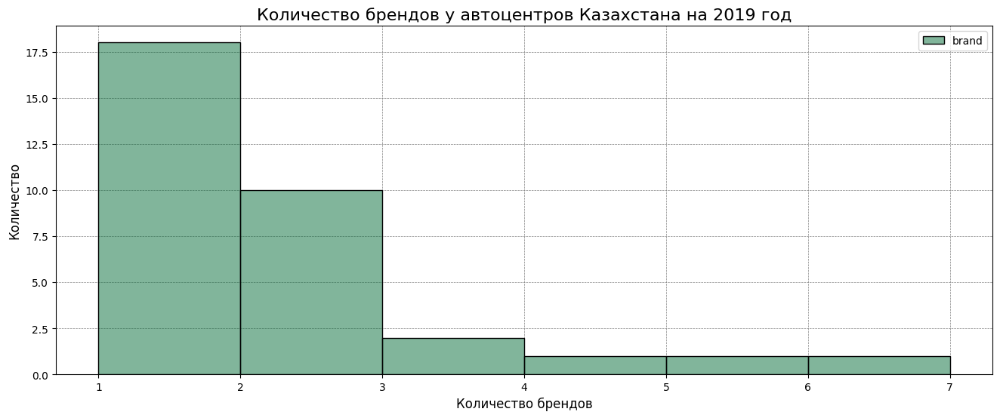

In [541]:
# построим график количество брендов у автоцентров
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.histplot(brand_comp, bins = 6)
ax = plt.gca()
ax.set_axisbelow(True)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, zorder=0)
ax.patch.set_facecolor('white')
plt.title('Количество брендов у автоцентров Казахстана на 2019 год', fontsize = 16)
plt.xlabel('Количество брендов', fontsize = 12)
plt.ylabel('Количество', fontsize = 12)
plt.show();

### Посмотрим на количество моделей в бренде

In [542]:
# посмотрим уникальные значения
auto.model.unique()

array(['A3', 'A4', 'A6', 'A7', 'A8', 'Q5', 'Q7', '3 серия', '5 серия',
       '6 серия', '7 серия', 'X1', 'X3', 'X4', 'X5', 'X6', 'X7', 'Z4',
       'Aveo', 'Captiva', 'Niva', 'Tahoe', 'Tracker', 'BS 106 A',
       'Fiesta', 'Mondeo', 'BJ3253DMPKB-AD', '2217', '2310', '2705',
       '2752', '3221', '3302', '3308', '3309', 'Next', 'Accent', 'Creta',
       'Elantra', 'Santa Fe', 'Sonata', 'TQ-1/H-1', 'County', 'H350',
       'HD 160', 'HD 170', 'HD 65', 'HD 78', 'Universe', 'Tucson', 'Q50',
       'QX50', 'QX60', 'QX80', 'D-MAX', 'NMR', 'NPR', 'Daily', 'Daily A',
       'Daily V', 'Stralis', 'Tipper', 'S3', 'S5', 'F-Pace', 'F-Type',
       'XE', 'XF', 'XJ', '4308', '4311', '43118', '43253', '43502',
       '44108', '45142', '45143', '53215', '53504', '53605', '54115',
       '5490', '65111', '65115', '65116', '65117', '6520', '65206',
       '65225', '66052', '6606', 'Cerato', 'Optima', 'Picanto', 'Quoris',
       'Rio', 'Sorento', 'Soul', 'Sportage', '4x4', 'Granta', 'Kalina',
       '

In [543]:
# посмотрим количество уникальных моделе
auto.model.nunique()

273

In [544]:
# создадим таблицу количества моделей в бренде
model_by_brand = auto.groupby('brand')['model'].nunique().reset_index().sort_values(by = 'model', ascending=False)

In [545]:
model_by_brand

,brand,model
18,KAMAZ,24
2,BMW,14
26,Mercedes-Benz,14
42,Volkswagen,13
12,Hyundai Truck & Bus,10
41,UAZ,10
9,GAZ,9
19,Kia,9
16,Jac,9
1,Audi,9


*Комментарий*

Всего моделей представлено 273. максимальное количество моделей у бренда KAMAZ - 24.

Выделим топ-10 брендов по количеству моделей.

In [546]:
# топ-10 брендов по количеству моделей
top_brands = model_by_brand.head(10)
top_brands

,brand,model
18,KAMAZ,24
2,BMW,14
26,Mercedes-Benz,14
42,Volkswagen,13
12,Hyundai Truck & Bus,10
41,UAZ,10
9,GAZ,9
19,Kia,9
16,Jac,9
1,Audi,9


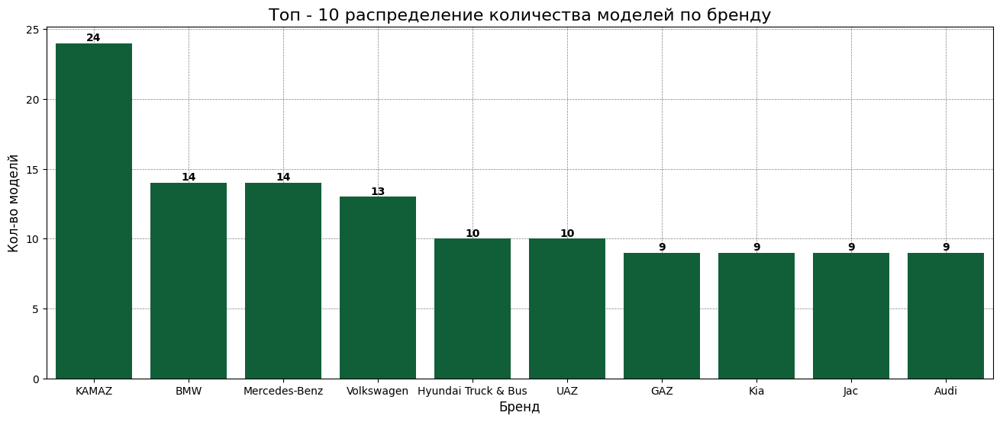

In [547]:
# распределение количества моделей по бренду
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.barplot(x="brand", y="model", data=top_brands, ci= None)

for x, y, tex in zip(top_brands.brand, top_brands.model, top_brands.model):
    t = plt.text(x, y, int(tex),
                 horizontalalignment='center',
                 rotation='horizontal',
                 verticalalignment='bottom',
                 fontdict={'color':'black', 'weight':'bold'})

ax = plt.gca()
ax.set_axisbelow(True)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, zorder=0)
ax.patch.set_facecolor('white')
plt.xlabel('Бренд',  fontsize = 12)
plt.ylabel('Кол-во моделй',  fontsize = 12)
plt.title('Топ - 10 распределение количества моделей по бренду',  fontsize = 16)
plt.xticks(rotation=0)
plt.show();

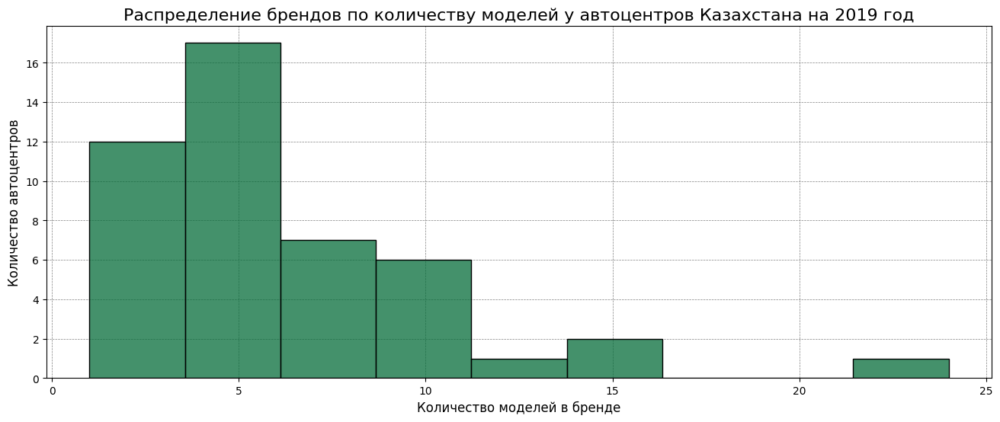

In [548]:
# построим график количество брендов у автоцентров
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.histplot(model_by_brand['model'])
ax = plt.gca()
ax.set_axisbelow(True)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, zorder=0)
ax.patch.set_facecolor('white')
plt.title('Распределение брендов по количеству моделей у автоцентров Казахстана на 2019 год', fontsize = 16)
plt.xlabel('Количество моделей в бренде', fontsize = 12)
plt.ylabel('Количество автоцентров', fontsize = 12)
plt.show();

*Комментарий*

На авто рынке Казахстана в 2019 году было представлено 273 модели авто. Лидер по количеству представленых моделей KAMAZ - 24, второе место разделяют BMW и Mercedes-Benz - 14 моделей, третье место у Volkswagen - 13. Наиболее частое количество моделей в бренде - 5.

### Посмотрим на год производства авто

In [549]:
# посмотрим количества продаж для каждого года производства
auto.release_year.value_counts()

2019    30418
2018     9153
2017      360
2016       30
2014        2
2013        1
2011        1
Name: release_year, dtype: int64

In [550]:
# посмотрим процентное соотношение
auto.release_year.value_counts(normalize=True).round(3).reset_index()


,index,release_year
0,2019,0.76
1,2018,0.23
2,2017,0.01
3,2016,0.00
4,2014,0.00
5,2013,0.00
6,2011,0.00


*Комментарий*

Наибольшее количество продаж у года выпуска 2019 - 30418, в процентном соотношении - 76%. Количество продаж 2018 года выпуска - 9153 или 23%.

### Посмотрим на страну производитель

In [551]:
# посмотрим значения в столбце
auto.manufacturing_country.unique()

array(['DEU', 'USA', 'AUT', 'KAZ', 'RUS', 'KOR', 'JPN', 'THA', 'CHN',
       'UK', 'UZB', 'HUN', 'TUR', 'ESP', 'NLD', 'POL', 'SWE', 'BLR',
       'BEL'], dtype=object)

In [552]:
# посмотрим количество уникальных значений
auto.manufacturing_country.nunique()

19

In [553]:
# посмотрим сколько на каждую страну приходиться количесва продаж авто
sale_country = auto.pivot_table(index = 'manufacturing_country', values = 'quantity', aggfunc='sum')\
.reset_index().sort_values(by='quantity', ascending=False)


In [554]:
# посмотрим сколько на каждую страну приходиться количесва продаж авто  в процентах
sale_country_per = auto.pivot_table(index = 'manufacturing_country', values = 'quantity', aggfunc=len).div(len(df.index)).mul(100)\
.reset_index().sort_values(by='quantity', ascending=False)


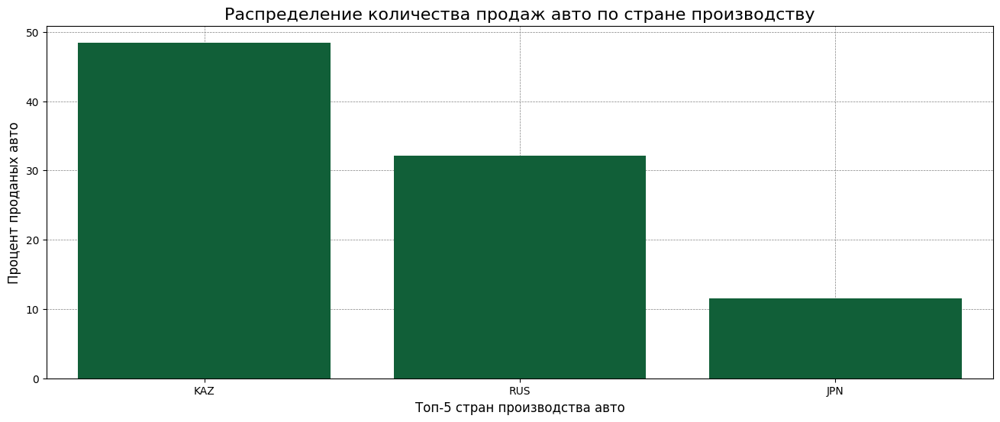

In [555]:
# распределение количества продаж авто по стране производству в процентах
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.barplot (x="manufacturing_country", y="quantity", data=sale_country_per.head(3), ci= None)
ax = plt.gca()
ax.set_axisbelow(True)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, zorder=0)
ax.patch.set_facecolor('white')

plt.xlabel('Топ-5 стран производства авто',  fontsize = 12)
plt.ylabel('Процент проданых авто',  fontsize = 12)
plt.title('Распределение количества продаж авто по стране производству',  fontsize = 16)
plt.xticks(rotation=0)
plt.show();

*Комментарий*

В 2019 году на авторынке Казахстана были представлены бренды из 19 стран. Наибольшие продажи у местного производителя - 48.46%, на втором месте Россия - 32.14%, третье место занимает Япония - 11.50%.

### Посмотрим тип топлива

In [556]:
# уникальные значения
auto.fuel_type.unique()

array(['Бензин', 'Дизель', 'Гибрид', 'Электричество'], dtype=object)

In [557]:
auto.fuel_type.value_counts()

Бензин           37770
Дизель            2171
Электричество       14
Гибрид              10
Name: fuel_type, dtype: int64

In [558]:
# посмотрим процентное соотношение
auto.fuel_type.value_counts(normalize=True).round(3).reset_index()


,index,fuel_type
0,Бензин,0.94
1,Дизель,0.05
2,Электричество,0.00
3,Гибрид,0.00


*Комментарий*

В основном авто рынок Казахстана продает авто с типом топлива Бензин - 94% и дизель - 5%.

### Посмотрим объем двигателя

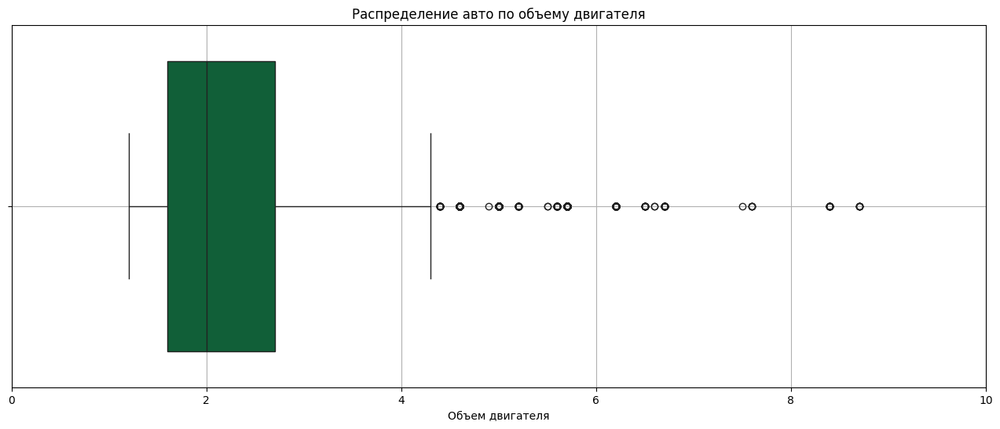

In [559]:
# посмотрим распределение авто на ранке Казахстана в 2019 году
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.boxplot(x='engine_volume', data=auto)
plt.xlabel('Объем двигателя')

plt.xlim(0, 10)
plt.grid()
plt.title('Распределение авто по объему двигателя')
plt.show()

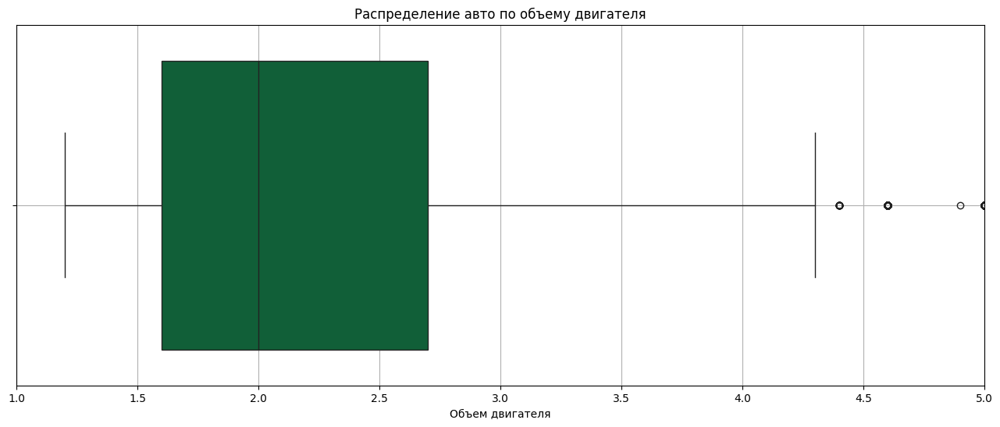

In [560]:
# посмотрим распределение авто на ранке Казахстана в 2019 году без выбросов
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.boxplot(x='engine_volume', data=auto)
plt.xlabel('Объем двигателя')
plt.xlim(1, 5)
plt.grid()
plt.title('Распределение авто по объему двигателя')
plt.show()

*Комментарий*

В основном в продаже присутствуют малолитражные и среднелитражные автомобили, с объемом двигателя 2 и 2.7

### Посмотрим количество автомобилей в заказе

In [561]:
auto.quantity.describe()

count   39965.00
mean        1.35
std         2.37
min         1.00
25%         1.00
50%         1.00
75%         1.00
max       115.00
Name: quantity, dtype: float64

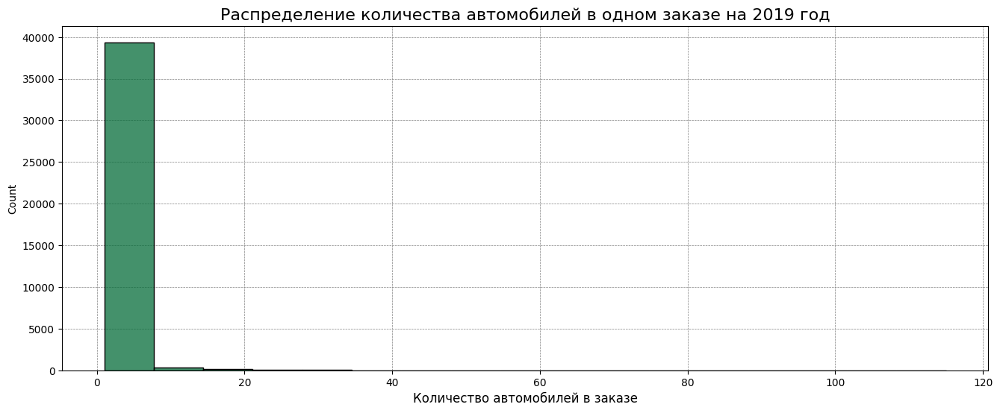

In [562]:
# построим график количества авто в заказе
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.histplot(auto.quantity)
ax = plt.gca()
ax.set_axisbelow(True)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, zorder=0)
ax.patch.set_facecolor('white')
plt.title('Распределение количества автомобилей в одном заказе на 2019 год', fontsize = 16)
plt.xlabel('Количество автомобилей в заказе', fontsize = 12)
plt.show();

In [563]:
# посмотрим компании у которых больше количество продаж
auto.query('quantity >= 20')['company'].unique()

array(['Allur Auto', 'БИПЭК АВТО', 'СВС-ТРАНС', 'Volkswagen Group Rus',
       'СемАЗ', 'Daewoo Bus Kazakhstan'], dtype=object)

*Комментарий*

В основном продается по одному автомобилю в заказе. Есть хвост продажи  115 единиц в заказе.

В данных есть 6 компаний, у которых в заказе 20 и более автомобилей. Volkswagen Group Rus - дочернее предприятие компании Volkswagen AG в России. Allur Auto - группа автомобильных компаний, занимающаяся производством и реализацией автомобилей, комплектующих и запчастей, а также сервисным обслуживанием автомобилей на территории Казахстана. БИПЭК АВТО - являлся партнёром «АвтоВАЗа», собирали машины марок Lada, Skoda, Chevrolet и KIA. СВС-ТРАНС - решение вопросов, связанных с приобретением коммерческого транспорта(грузовиков, спецтехники, погрузчиков и пр.). СемАЗ - автосборочный завод «СемАЗ», компания принимает активное участие в государственных закупках. Daewoo Bus Kazakhstan - строится на базе завода «СемАЗ».

Такое количество автомобилей в заказе может быть обусловлено коммерческой закупкой автомобилей, государственной закупкой или продажей в автоцентры.  

### Посмотрим столбец price_usd

In [564]:
auto.price_usd.describe()

count    39965.00
mean     28249.97
std      20005.97
min       7100.00
25%      15518.50
50%      24282.27
75%      32505.66
max     328510.97
Name: price_usd, dtype: float64

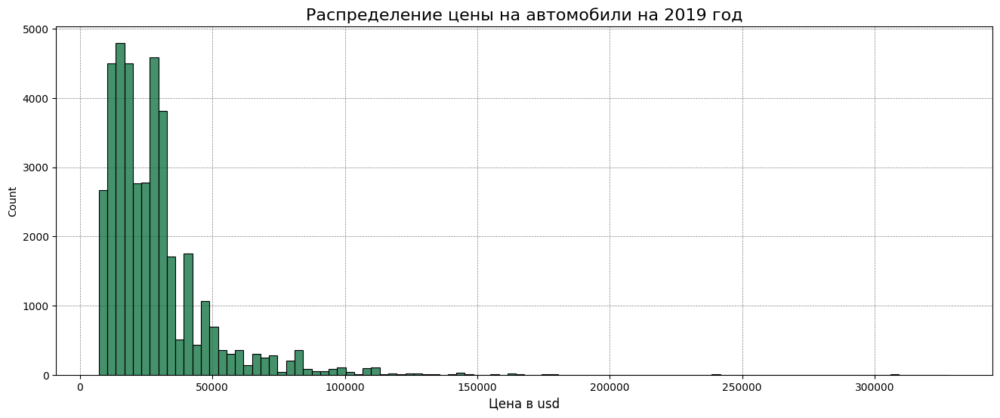

In [565]:
# построим график цен на авто
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.histplot(auto.price_usd, bins=100)
ax = plt.gca()
ax.set_axisbelow(True)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5, zorder=0)
ax.patch.set_facecolor('white')
plt.title('Распределение цены на автомобили на 2019 год', fontsize = 16)
plt.xlabel('Цена в usd', fontsize = 12)
plt.show();

*Комментарий*

Минимальная цена за автомобиль - 7100 usd, среднее - 28249.97 usd, максимальная - 328510.97 usd.

В основном большинство цен находится в диапазоне от 10 000 до 50 000, наблюдаем пики на 15000 и 30000.

In [566]:
# посмотрим продажи превышающие 200 000
auto.query('price_usd > 200000')

,year,month,company,brand,model,release_year,manufacturing_country,fuel_type,engine_volume,transmission,drive_type,region,client_type,quantity,price_usd,sell_price_usd,state,segment_2013,class_2013,sales_data,engine_volume_category,segment_2013_category
9699,2019,01,Hyundai Com Trans Kazakhstan,Hyundai Truck & Bus,Universe,2017,KOR,Дизель,12.30,MT,2WD,Алматы,юр.лицо,2,207148.62,414297.25,г.Алматы,Коммерческие автомобили,Большие автобусы,2019-01-01,крупнолитражные,коммерческие автомобили
9700,2019,03,Hyundai Com Trans Kazakhstan,Hyundai Truck & Bus,Universe,2017,KAZ,Дизель,12.30,MT,2WD,Алматы,юр.лицо,2,243388.74,486777.47,г.Алматы,Коммерческие автомобили,Большие автобусы,2019-03-01,крупнолитражные,коммерческие автомобили
9701,2019,06,Hyundai Com Trans Kazakhstan,Hyundai Truck & Bus,Universe,2017,KAZ,Дизель,12.30,MT,2WD,Алматы,юр.лицо,1,240826.56,240826.56,г.Алматы,Коммерческие автомобили,Большие автобусы,2019-06-01,крупнолитражные,коммерческие автомобили
9702,2019,06,Hyundai Com Trans Kazakhstan,Hyundai Truck & Bus,Universe,2017,KAZ,Дизель,12.30,MT,2WD,Алматы,юр.лицо,1,240826.56,240826.56,г.Алматы,Коммерческие автомобили,Большие автобусы,2019-06-01,крупнолитражные,коммерческие автомобили
9703,2019,07,Hyundai Com Trans Kazakhstan,Hyundai Truck & Bus,Universe,2017,KAZ,Дизель,12.30,MT,2WD,Алматы,юр.лицо,1,239718.66,239718.66,г.Алматы,Коммерческие автомобили,Большие автобусы,2019-07-01,крупнолитражные,коммерческие автомобили
9704,2019,07,Hyundai Com Trans Kazakhstan,Hyundai Truck & Bus,Universe,2017,KAZ,Дизель,12.30,MT,2WD,Алматы,юр.лицо,1,239718.66,239718.66,г.Алматы,Коммерческие автомобили,Большие автобусы,2019-07-01,крупнолитражные,коммерческие автомобили
9705,2019,09,Hyundai Com Trans Kazakhstan,Hyundai Truck & Bus,Universe,2019,KAZ,Дизель,12.30,MT,2WD,Алматы,юр.лицо,1,242854.52,242854.52,г.Алматы,Коммерческие автомобили,Большие автобусы,2019-09-01,крупнолитражные,коммерческие автомобили
18761,2019,04,Almaty Motors Premium,Land Rover,Range Rover,2019,UK,Бензин,5.00,АТ,4WD,Алматы,физ.лицо,1,218681.74,218681.74,г.Алматы,Внедорожники,Полноразмерные SUV,2019-04-01,крупнолитражные,некоммерческие автомобили
18781,2019,06,Almaty Motors Premium,Land Rover,Range Rover,2019,UK,Бензин,5.00,АТ,4WD,Алматы,юр.лицо,1,209414.40,209414.40,г.Алматы,Внедорожники,Полноразмерные SUV,2019-06-01,крупнолитражные,некоммерческие автомобили
20402,2019,05,Autokapital,Mercedes-Benz Trucks,Tourismo,2019,TUR,Дизель,12.00,АТ,RWD,Атырау,юр.лицо,1,305252.02,305252.02,Атырауская область,Коммерческие автомобили,Большие автобусы,2019-05-01,крупнолитражные,коммерческие автомобили


*Комментарий*

В основном это большие автобусы и коммерческие автомобили.

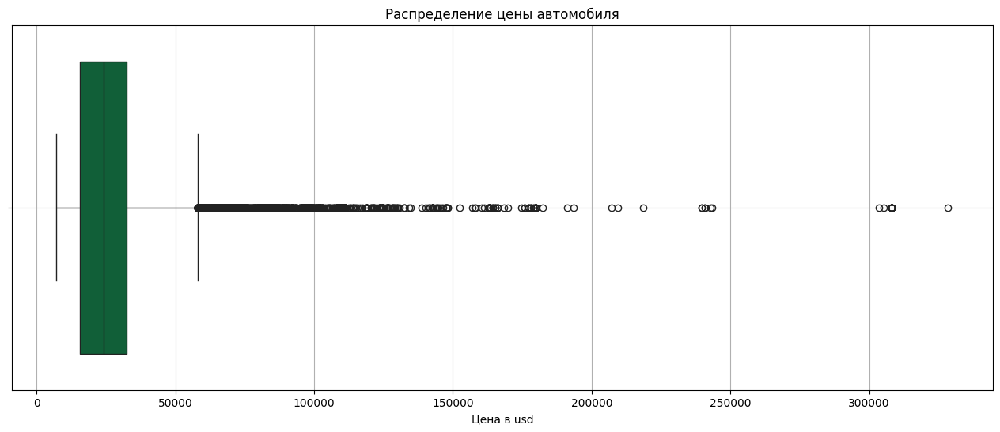

In [567]:
# посмотрим распределение цены на автомобиль на ранке Казахстана в 2019 году
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.boxplot(x='price_usd', data=auto)
plt.xlabel('Цена в usd')
plt.grid()
plt.title('Распределение цены автомобиля')
plt.show()

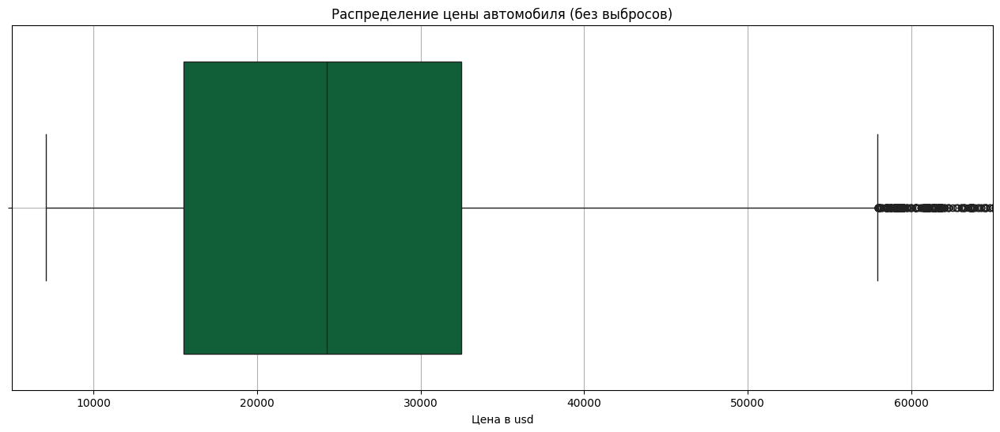

In [568]:
# посмотрим распределение цены на автомобиль на ранке Казахстана в 2019 году
sns.set_palette('YlGn_r')
plt.figure(figsize=(16, 6))
sns.boxplot(x='price_usd', data=auto)
plt.xlabel('Цена в usd')
plt.xlim(5000, 65000)
plt.grid()
plt.title('Распределение цены автомобиля (без выбросов)')
plt.show()

*Комментарий*

Ценовой диапазон с 7 000 до 58 000. Большая часть цен размещается с 16 000 до 33 000. Медианая цена - 24 000.

### Вывод


    В Казахтане авто рынок представляют 33 компании и 46 брендов.
    Максимальное количество брендов у автоцентра Allur Auto - 7.
    Количество монобрендовых компаний - 18, мультибрендовых - 15.
    Всего моделей представлено 273. Максимальное количество моделей у бренда KAMAZ - 24. Второе место разделяют BMW и Mercedes-Benz - 14 моделей, третье место у Volkswagen - 13.
    Наиболее частое количество моделей в бренде - 5.

    Наибольшее количество продаж у года выпуска 2019 - 30418, в процентном соотношении - 76%. Количество продаж 2018 года   выпуска - 9153 или 23%.
    В 2019 году на авторынке Казахстана были представлены бренды из 19 стран. Наибольшие продажи у местного производителя - 48.46%, на втором месте Россия - 32.14%, третье место занимает Япония - 11.50%.
    Авто с типом топлива Бензин - 94% и дизель - 5%.
    Распределения авто по объему двигателя: минимальное - 1.2, среднее - 2.28, медиана - 2.0, максимальное - 13.0.
    В основном в продаже присутствуют автомобили с объемом двигателя от 1.2 до 3.8, основные продажи приходятся на двигатели от 1.6 до 2.5 литров.

    В основном продается по одному автомобилю в заказе. Есть хвост продажи 115 единиц в заказе.
    Есть 6 компаний, у которых в заказе 20 и более автомобилей: Volkswagen Group Rus, Allur Auto, БИПЭК АВТО, СВС-ТРАНС, СемАЗ, Daewoo Bus Kazakhstan.
    Такое количество автомобилей в заказе может быть обусловлено коммерческой закупкой автомобилей, государственной закупкой или продажей в автоцентры.

    Минимальная цена за автомобиль - 7100 usd, среднее - 28249.97 usd, максимальная - 328510.97 usd.
    В основном большинство цен находится в диапазоне от 10 000 до 50 000, наблюдаем пики на 15000 и 30000. Выбросы более 200 000 - автобусы и коммерческие автомобили.
    Ценовой диапазон с 7 000 до 58 000. Большая часть цен размещается с 16 000 до 33 000. Медианая цена - 24 000.


Чтоб не повлиять на дальнейший анализ мы не будем избавляться от выбросов. Стоит обратить внимание на сегмент - Коммерческие автомобили, там мы видели выбросы по стоимости авто.


## Исследуем продажи на рынке Казахстана

Категоризируем тип данных для столбцов: сегментация, объем двигателя.

In [569]:
categor_columns = ['engine_volume_category', 'segment_2013_category']
for col in categor_columns:
    auto[col] = auto[col].astype('category')

### Рассмотрим емкость рынка исходя из имеющихся данных на 2019 год.

In [570]:
# посмотрим ёмкость рынка авто Казахстана за 9 месяцев
len(auto)

39965

*Комментарий*

У нас нет данных за четвертый квартал. Мы можем предположить, что продажи в четвертом квартале будут больше, так как в конце года осуществляются основные продажи. Это примерно 40-50% от общегодовых, для расчета возьмем - 40%.

In [571]:
# расчитаем прогноз емкости рынка авто в Казахстане на 2019 год
int(len(auto) + len(auto) * 0.4)

55951

In [572]:
# посмотрим продажи авто Казахстана за 9 месяцев в usd
auto.sell_price_usd.sum().round(2)

1349194556.31

In [573]:
# расчитаем продажи авто Казахстана на 2019 год в usd
(auto.sell_price_usd.sum() + auto.sell_price_usd.sum() * 0.4).round(2)

1888872378.83

In [574]:
# расчитаем среднюю стоимость продажи за автомобиль
(auto.sell_price_usd.sum() / len(auto)).round(2)

33759.4

In [575]:
# расчитаем ёмкость сегмента - комерческое авто за 9 месяцев
auto[auto['segment_2013_category'] == 'коммерческие автомобили']['sell_price_usd'].sum().round(2)

185811934.25

In [576]:
# расчитаем ёмкость сегмента - некомерческое авто за 9 месяцев
auto[auto['segment_2013_category'] == 'некоммерческие автомобили']['sell_price_usd'].sum().round(2)

1163382622.05

In [577]:
colors = ['#32CD32', '#FFFF00']
fig = go.Figure()
fig.add_trace(go.Pie(values=auto.sell_price_usd, labels=auto.segment_2013_category, hole=0.6, marker=dict(colors=colors)))

fig.update_layout(autosize=False,
                  width=1000,
                  height=400,
                  title='Соотношение доли некомерческих и комерческих автомобилей на рынке Казахстана за 9 месяцев')

fig.show()

![Соотношение доли некомерческих и комерческих автомобилей на рынке Казахстана за 9 месяцев](1.png)

In [578]:
# расчитаем ёмкость продаж физ.лицам авто за 9 месяцев
auto[auto['client_type'] == 'физ.лицо']['sell_price_usd'].sum().round(2)

832065454.09

In [579]:
# расчитаем ёмкость продаж юр.лицам авто за 9 месяцев
auto[auto['client_type'] == 'юр.лицо']['sell_price_usd'].sum().round(2)

517129102.22

In [580]:
colors = ['#32CD32', '#FFFF00']
fig = go.Figure()
fig.add_trace(go.Pie(values=auto.sell_price_usd, labels=auto.client_type, hole=0.6, marker=dict(colors=colors)))
fig.update_layout(autosize=False,
    width=1000,
    height=400,
    title='Соотношение доли покупателей на рынке Казахстана за 9 месяцев')
fig.show()

![Соотношение доли покупателей на рынке Казахстана за 9 месяцев](2.png)

*Комментарий*

За 9 месяце 2019 года в Казахстане было продано 39 965 автомобилей стоимостью - 1 349 194 556.31 долларов. Прогнозируемы продажи за 2019 год составят 55 951 автомобилей стоимостью - 1 888 872 378.83 долларов. Средняя стоимость автомобиля за 9 месяцев - 33 759.4 долларов. Сегмент коммерческого авто составляет - 13.8%, некоммерческого авто - 86.2% от общего объема. Доля покупок авто пришедшиеся на физ.лицо составила - 61.7%, на юр.лицо - 38.3%.

### Рассмотрим как распределены бренды по сегментам коммерческое/некоммерческое авто.

Сначала посмотрим по продажам.

In [581]:
# таблица коммерческого авто
segment_comm = (
    auto[auto['segment_2013_category'] == 'коммерческие автомобили'].groupby('brand')['sell_price_usd'].sum()
    .sort_values(ascending = False)
    .to_frame()
    .reset_index()
    .nlargest(10, 'sell_price_usd')

)
prise_comm = segment_comm['sell_price_usd'].tolist()
brand_comm = segment_comm['brand'].tolist()

In [582]:
# таблица не коммерческого авто
segment_nocomm = (
    auto[auto['segment_2013_category'] == 'некоммерческие автомобили'].groupby('brand')['sell_price_usd'].sum()
    .sort_values(ascending = False)
    .to_frame()
    .reset_index()
    .nlargest(10, 'sell_price_usd')

)
prise_nocomm = segment_nocomm['sell_price_usd'].tolist()
brand_nocomm = segment_nocomm['brand'].tolist()

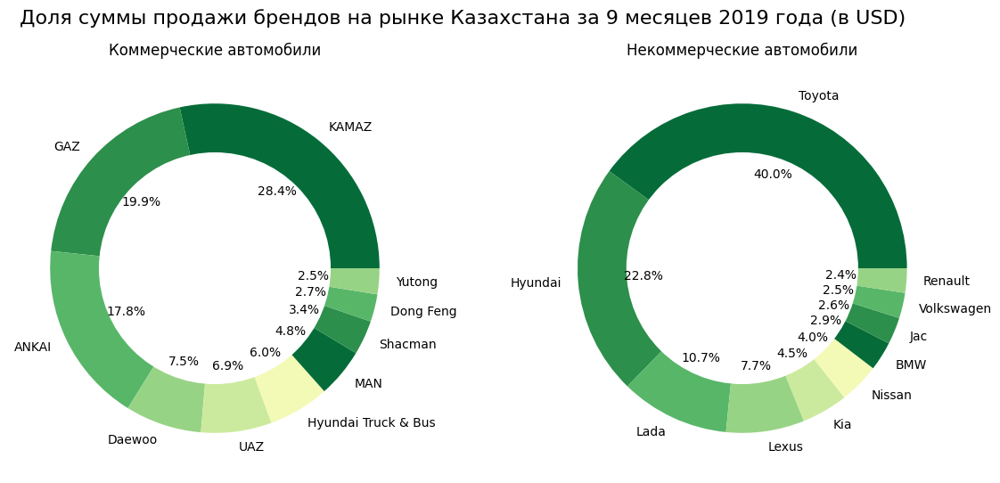

In [583]:
# рисуем график
sns.set_palette('YlGn_r')
plt.figure(figsize=(14, 6))
plt.suptitle('Доля суммы продажи брендов на рынке Казахстана за 9 месяцев 2019 года (в USD)', fontsize = 16)
plt.subplot(1,2,1)
plt.title('Коммерческие автомобили')
plt.pie(prise_comm, labels=brand_comm, autopct='%1.1f%%')
circle= plt.Circle( (0,0), 0.7, color = 'white')
p=plt.gcf()
p.gca().add_artist(circle)


plt.subplot(1,2,2)
plt.title('Некоммерческие автомобили')
plt.pie(prise_nocomm, labels=brand_nocomm, autopct='%1.1f%%')
circle= plt.Circle( (0,0), 0.7, color = 'white')
p=plt.gcf()
p.gca().add_artist(circle)

plt.show()

*Комментарий*

Коммерческие автомобили.

     Лидер продаж - Kamaz 28.4%
     Второе место - Gaz 19.9%
     Третье место - Ankai 17.8%
   
Почти половину рынка 48.3% занимают автомобили Российских брендов.


Некоммерческие автомобили.

    Лидер продаж - Toyota 40%
    Второе место - Hyundai 22.8%
    Третье место - Lada 10.7%

Из них больше половины рынка - 62.8% занимают автомобили Японских брендов.

Посмотрим долю продаж в сегментах по количеству проданых автомобилей.

In [584]:
# таблица коммерческого авто
segment_comm = (
    auto[auto['segment_2013_category'] == 'коммерческие автомобили'].groupby('brand')['quantity'].sum()
    .sort_values(ascending = False)
    .to_frame()
    .reset_index()
    .nlargest(10, 'quantity')

)
q_comm = segment_comm['quantity'].tolist()
brand_comm = segment_comm['brand'].tolist()

In [585]:
# таблица не коммерческого авто
segment_nocomm = (
    auto[auto['segment_2013_category'] == 'некоммерческие автомобили'].groupby('brand')['quantity'].sum()
    .sort_values(ascending = False)
    .to_frame()
    .reset_index()
    .nlargest(10, 'quantity')

)
q_nocomm = segment_nocomm['quantity'].tolist()
brand_nocomm = segment_nocomm['brand'].tolist()

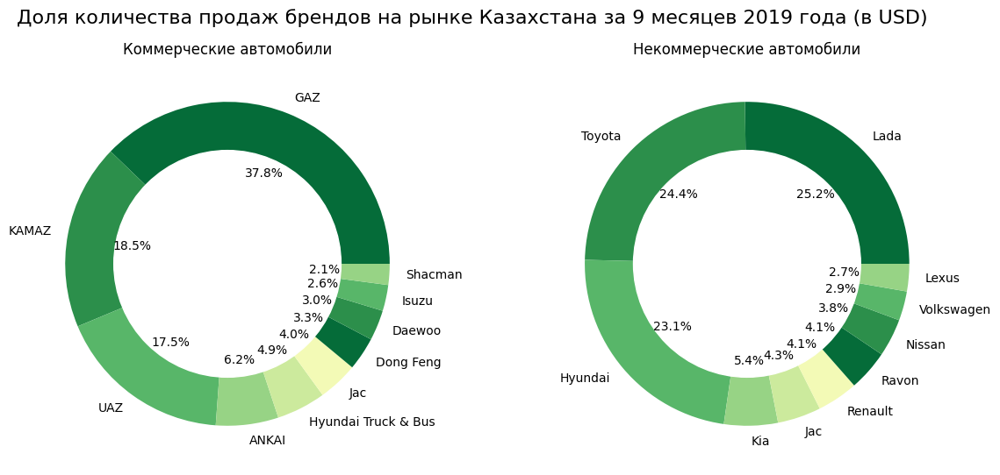

In [586]:
# рисуем график
sns.set_palette('YlGn_r')
plt.figure(figsize=(14, 6))
plt.suptitle('Доля количества продаж брендов на рынке Казахстана за 9 месяцев 2019 года (в USD)', fontsize = 16)
plt.subplot(1,2,1)
plt.title('Коммерческие автомобили')
plt.pie(q_comm, labels=brand_comm, autopct='%1.1f%%')
circle= plt.Circle( (0,0), 0.7, color = 'white')
p=plt.gcf()
p.gca().add_artist(circle)


plt.subplot(1,2,2)
plt.title('Некоммерческие автомобили')
plt.pie(q_nocomm, labels=brand_nocomm, autopct='%1.1f%%')
circle= plt.Circle( (0,0), 0.7, color = 'white')
p=plt.gcf()
p.gca().add_artist(circle)

plt.show()

*Комментарий*

Коммерческие автомобили.

     Лидер продаж - Gaz 37.8%
     Второе место - KAMAZ 18.5%
     Третье место - UAZ 17.5%
   
Более половины рынка 73.8% занимают автомобили Российских брендов.


Некоммерческие автомобили.

    Лидер продаж - Lada  25.2%
    Второе место - Toyota  24.4%
    Третье место - Hyundai 23.1%

По количеству проданых автомобилей лидеры различаются минимально.

### Рассмотрим продажи по месяцам

In [587]:
sale_month = auto.groupby('sales_data')['sell_price_usd'].sum().to_frame().reset_index()

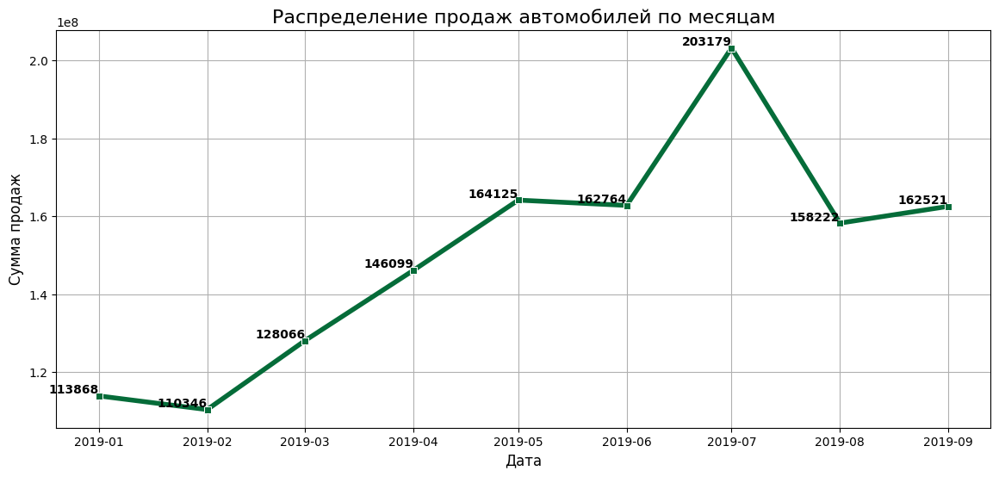

In [588]:
# рассмотрим распределение продаж автомобилей по месяцам
sns.set_palette('YlGn_r')
plt.figure(figsize=(14,6))
plt.title("Распределение продаж автомобилей по месяцам",  fontsize = 16)
sns.lineplot(data=sale_month, x="sales_data", y="sell_price_usd", markers=True, dashes=False, linewidth=4, marker="s")

for x, y, tex in zip(sale_month.sales_data, sale_month.sell_price_usd, sale_month.sell_price_usd):
    t = plt.text(x, y, int(tex/1000),
                 horizontalalignment='right',
                 rotation='horizontal',
                 verticalalignment='bottom',
                 fontdict={'color':'black', 'weight':'bold'})


plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Сумма продаж',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

На графике видим провалы в продажах в январе и феврале на авто рынке. С марта до мая постепенный рост, с мая по июнь не значительный спад. Резкий рост с пиковым значение в июле, далее продажи возвращаются на уровень май-июнь.

### Посмотрим продажи по категории коммерческий/некоммерческий

In [589]:
segment_month = auto.groupby(['segment_2013_category','sales_data'])['sell_price_usd'].sum().to_frame().reset_index()

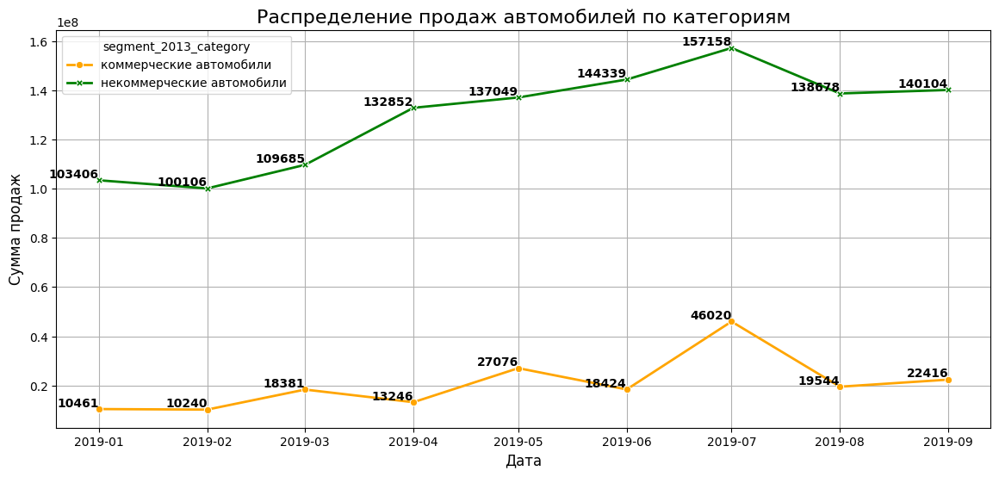

In [590]:
# рассмотрим распределение продаж автомобилей по категориям
plt.figure(figsize=(14,6))

plt.title("Распределение продаж автомобилей по категориям",  fontsize = 16)
sns.lineplot(data=segment_month, x="sales_data", y="sell_price_usd", hue="segment_2013_category", style="segment_2013_category",\
             markers=True, dashes=False, linewidth=2, palette={"коммерческие автомобили": "orange", "некоммерческие автомобили": "green"})

for x, y, tex in zip(segment_month.sales_data, segment_month.sell_price_usd, segment_month.sell_price_usd):
    t = plt.text(x, y, int(tex/1000),
                 horizontalalignment='right',
                 rotation='horizontal',
                 verticalalignment='bottom',
                 fontdict={'color':'black', 'weight':'bold'})


plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Сумма продаж',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

По графику можем определить, что основные продажи в некоммерческом транспорте. В коммерческом сегменте основные продажи произошли в июле, что дало на общем графике сильный пик. Графики по сегментам в целом похожи по динамике.

### Рассмотрим продажи по классу

In [591]:
class_month = auto.groupby(['class_2013','sales_data'])['sell_price_usd'].sum().to_frame().reset_index()

In [592]:
# рассмотрим распределение продаж автомобилей по классу

fig = px.line(class_month,
              x='sales_data',
              y='sell_price_usd',
              color='class_2013',
              markers=True)

fig.update_layout(title='Распределение продаж автомобилей по классу',
                  xaxis_title='Дата',
                  yaxis_title='Сумма продаж',
                  width=1400,
                  height=600)
fig.show()

![Распределение продаж автомобилей по классу](3.png)

*Комментарий*

Наиболее продаваемые к сентябрю - компактные SUV и В класс. На графике видим пики в июле для D класса, субкомпактных SUV, больших автобусов, С класса, Крупнотонажных грузовиков.

### Рассмотрим продажи по сегментам

In [593]:
month_segment_2013 = auto.groupby(['segment_2013','sales_data'])['sell_price_usd'].sum().to_frame().reset_index()


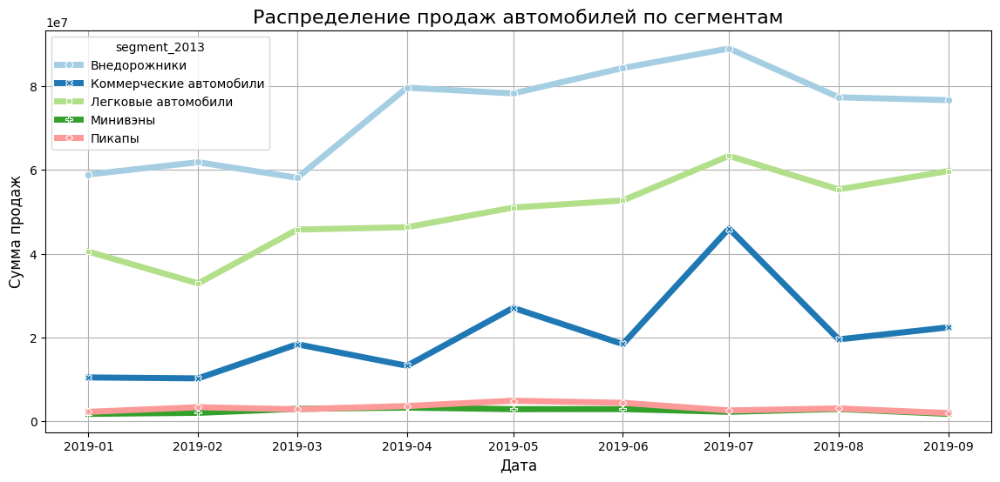

In [594]:
# рассмотрим распределение продаж автомобилей по сегментам
sns.set_palette('Paired')
plt.figure(figsize=(14,6))
plt.title("Распределение продаж автомобилей по сегментам",  fontsize = 16)
sns.lineplot(data=month_segment_2013, x="sales_data", y="sell_price_usd", hue="segment_2013", style="segment_2013",\
             markers=True, dashes=False, linewidth=5)


plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Сумма продаж',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

Лидером продаж на рынке Казахстана являются - внедорожники. На втором месте - легковые автомобили. На третьем -коммерческий транспорт. Минивены и пикапы наименее продаются.

#### Посмотрим на лидеров в каждом сегменте

In [595]:
auto[auto['segment_2013'] == 'Внедорожники'].groupby(['brand', 'model'])['sell_price_usd'].sum().nlargest(5).reset_index()

,brand,model,sell_price_usd
0,Hyundai,Tucson,87315649.16
1,Toyota,LC Prado,83134112.05
2,Toyota,LC200,57893775.93
3,Hyundai,Creta,35222266.67
4,Toyota,RAV4,33725128.08


In [596]:
auto[auto['segment_2013'] == 'Легковые автомобили'].groupby(['brand', 'model'])['sell_price_usd'].sum().nlargest(5).reset_index()

,brand,model,sell_price_usd
0,Toyota,Camry,155748735.08
1,Hyundai,Elantra,41269145.64
2,Hyundai,Accent,36481914.44
3,Toyota,Corolla,33896784.80
4,Lada,Vesta,31116273.68


In [597]:
auto[auto['segment_2013'] == 'Коммерческие автомобили'].groupby(['brand', 'model'])['sell_price_usd'].sum().nlargest(5).reset_index()


,brand,model,sell_price_usd
0,ANKAI,HFF6850G,19592899.74
1,GAZ,3302,15664493.09
2,KAMAZ,65115,12584301.64
3,KAMAZ,43118,9818010.24
4,GAZ,Next,8929641.52


*Комментарий*

Во внедорожниках лидиреут кроссовер Hyundai Tucson. Лидером легковых автомобилей стал представитель седанов среднего класса -Toyota Camry. В коммерсеском секторе на первом месте городской автобус - ANKAI HFF6850G.

### Рассмотрим продажи по объему двигателя

In [598]:
month_engine_volume = auto.groupby(['engine_volume_category','sales_data'])['sell_price_usd'].sum().to_frame().reset_index()


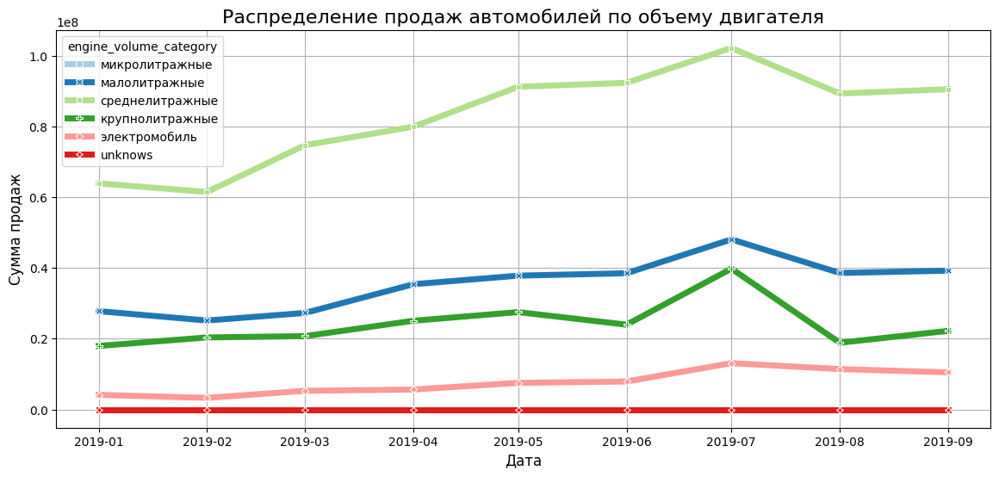

In [599]:
# рассмотрим распределение продаж автомобилей по объему двигателя
sns.set_palette('Paired')
plt.figure(figsize=(14,6))
plt.title("Распределение продаж автомобилей по объему двигателя",  fontsize = 16)
sns.lineplot(data=month_engine_volume, x="sales_data", y="sell_price_usd", hue="engine_volume_category", style="engine_volume_category",\
             markers=True, dashes=False, linewidth=5)
plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Сумма продаж',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

Основу продаж состаляют среднелитражные автомобили. На втором месте - малолитражные, на третьем - крупнолитражные. Продажи электромобилей стабильно не высокие. В целом все графики категорий объема двигателя показывают схожую динамику с пиком продаж в июле.

#### Посмотрим какая модель является лидером продаж

In [600]:
auto[auto['engine_volume_category'] == 'крупнолитражные'].groupby(['brand', 'model'])['sell_price_usd'].sum().nlargest(5).reset_index()


,brand,model,sell_price_usd
0,Toyota,LC200,57893775.93
1,Lexus,LX,33640569.08
2,Toyota,LC Prado,20011642.10
3,ANKAI,HFF6850G,19592899.74
4,Mercedes-Benz,G-Class,9815009.58


In [601]:
auto[auto['engine_volume_category'] == 'среднелитражные'].groupby(['brand', 'model'])['sell_price_usd'].sum().nlargest(5).reset_index()

,brand,model,sell_price_usd
0,Toyota,Camry,149315683.23
1,Hyundai,Tucson,86670405.72
2,Toyota,LC Prado,63122469.95
3,Toyota,RAV4,33725128.08
4,Toyota,Corolla,26869180.61


In [602]:
auto[auto['engine_volume_category'] == 'малолитражные'].groupby(['brand', 'model'])['sell_price_usd'].sum().nlargest(5).reset_index()

,brand,model,sell_price_usd
0,Hyundai,Accent,36481914.44
1,Hyundai,Elantra,32479551.85
2,Lada,Vesta,31116273.68
3,Hyundai,Creta,29935130.67
4,Lada,Granta,26671905.26


*Комментарий*

В крупнолитражных лидирует джип Toyota LC200, у среднелитражных на первом месте седан Toyota Camry, в малолитражных лидер продаж - Hyundai Accent.

### Рассмотрим продажи по типу топлива

In [603]:
month_fuel_type = auto.groupby(['fuel_type','sales_data'])['sell_price_usd'].sum().to_frame().reset_index()

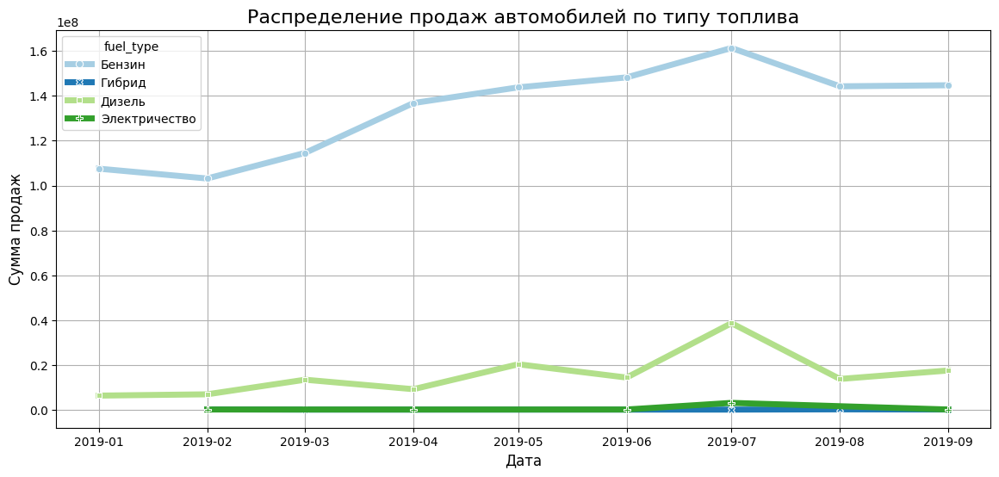

In [604]:
# рассмотрим распределение продаж автомобилей по типу топлива
sns.set_palette('Paired')
plt.figure(figsize=(14,6))
plt.title("Распределение продаж автомобилей по типу топлива",  fontsize = 16)
sns.lineplot(data=month_fuel_type, x="sales_data", y="sell_price_usd", hue="fuel_type", style="fuel_type",\
             markers=True, dashes=False, linewidth=5)
plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Сумма продаж',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

Основу продаж составляют бензиновые автомобили. График автомобилей на дизеле повторяет динамику графика коммерческих автомобилей. Продажи гибрида и электромобилей довольно низкие.

### Посмотрим количество компаний продающие в этих сегментах

In [605]:
company_segment = auto.pivot_table(index='segment_2013_category', columns='engine_volume_category',\
                                   values='company', aggfunc='nunique').reset_index()

In [606]:
company_segment.columns = [''.join(str(s).strip() for s in col if s) for col in company_segment.columns]

In [607]:
company_segment

,segment_2013_category,микролитражные,малолитражные,среднелитражные,крупнолитражные,электромобиль,unknows
0,коммерческие автомобили,0,2,9,8,2,0
1,некоммерческие автомобили,0,18,24,8,1,0


In [608]:
company_segment.columns = ['segment_2013_category', 'микролитражные', 'малолитражные', 'среднелитражные', 'крупнолитражные', \
                            'электромобиль', 'unknows']

In [609]:
# построим график отображающий колличество компаний в каждом сегменте
fig = px.histogram(company_segment, x="segment_2013_category", y=['малолитражные', 'среднелитражные', 'крупнолитражные', \
                            'электромобиль'], histfunc="avg", nbins=8)
fig.update_layout(
                  title="Количество компаний в каждом сегменте",
                  xaxis_title="Сегменты рынка",
                  yaxis_title="Количество компаний",
                  width=1000,
                  height=500
                  )
fig.show();

![Количество компаний в каждом сегменте](4.png)

*Комментарий*

Логично было ожидать, что в самом прибыльном сегменте - некоммерсекие автомобили, конкуренция среди компаний выше.

### Частичный RFM анализ сегментации моделей

Так как данные обезличены, пункт с давностью покупки рассматривать не будем.

In [610]:
auto['f'] = auto.groupby('model')['model'].transform('count')
auto['m'] = auto.groupby('model')['sell_price_usd'].transform('sum')

In [611]:
auto['f'] = pd.qcut(auto['f'], 3, labels=[1,2,3])
auto['m'] = pd.qcut(auto['m'], 3, labels=[1,2,3])

In [612]:
auto['fm'] = auto['f'].astype('str') + auto['m'].astype('str')

*Комментарий*

    f (частота покупок): 1 - редкая; 2 - средняя частота; 3 - часто покурают
    m (сумма покупок): 1 - незначительная; 2 - средняя; 3 - высокая.

Сегменты идут от 11(редкая покупка за низкую цену) до 33(частая покупка за высокую цену). Наилучший сегмент 33, среднее значение повторение 2 и 3 f и m.

In [613]:
auto[auto.fm.isin(['22', '23', '32', '33'])].groupby('brand')['model'].unique().reset_index()

,brand,model
0,Hyundai,"[Accent, Creta, Elantra, Santa Fe, Tucson]"
1,Jac,[S3]
2,Lada,[Vesta]
3,Ravon,[Nexia R3]
4,Toyota,"[Camry, Corolla, HILUX DC, LC Prado, LC200, RAV4]"


*Комментарий*

В высокие значения попали 5 брендов: Hyundai, Jac, Lada, Ravon, Toyota. Модели: Accent, Creta, Elantra, Santa Fe, Tucson, S3, Vesta, Nexia R3, Camry, Corolla, HILUX DC, LC Prado, LC200, RAV4.Большинство моделей пренадлежат брендам Hyundai и Toyota.

Посмотрим сегмент 33.

In [614]:
auto[auto['fm'] == '33'].groupby('brand')['model'].unique().reset_index()

,brand,model
0,Hyundai,"[Elantra, Tucson]"
1,Toyota,[Camry]


*Комментарий*

В сегмент 33 попали 2 бренда: Hyundai и Toyota. Модели: Elantra, Tucson, Camry.

### Посмотрим продажи по брендам

In [615]:
# продажи по бренду
brand_sell = auto.groupby('brand')['sell_price_usd'].sum()

In [616]:
top_5_brands = brand_sell.nlargest(5)

In [617]:
# суммируем остальных для создания категории "Остальные"
other_brands_sum = brand_sell[~brand_sell.index.isin(top_5_brands.index)].sum()

In [618]:
# cоздаем новый датафрейм для объединения топ-5 и "Остальных"
final_brand_sell = top_5_brands.reset_index()
final_brand_sell = final_brand_sell.append({'brand': 'Others', 'sell_price_usd': other_brands_sum}, ignore_index=True)

In [619]:
# посмотрим топ-5 брендов по продажам
fig = go.Figure()
fig.add_trace(go.Pie(values=final_brand_sell['sell_price_usd'], labels=final_brand_sell['brand'], hole=0.5, textinfo='label+percent', showlegend=False))
fig.update_layout(autosize=False,
    width=900,
    height=600,
    title='Топ-5 брендов по продажам в Казахстане в 2019 году')
fig.show()

![Топ-5 брендов по продажам в Казахстане в 2019 году](5.png)

*Комментарий*

Лидер продаж по брендам - Toyota, на втором месте - Hyundai, третье место у Lada.

In [620]:
# количество проданых автомобилей
brand_q = auto.groupby('brand')['quantity'].sum()


In [621]:
top_10_bq = brand_q.nlargest(10)

In [622]:
# суммируем остальных для создания категории "Остальные"
other_bq = brand_q[~brand_q.index.isin(top_10_bq.index)].sum()

In [623]:
# cоздаем новый датафрейм для объединения топ-10 и "Остальных"
final_bq = top_10_bq.reset_index()
final_bq = final_bq.append({'brand': 'Others', 'quantity': other_bq}, ignore_index=True)

In [624]:
# посмотрим топ-10 брендов по количеству проданых авто
fig = go.Figure()
fig.add_trace(go.Pie(values=final_bq ['quantity'], labels=final_bq ['brand'], hole=0.5, textinfo='label+percent', showlegend=False))
fig.update_layout(autosize=False,
    width=900,
    height=600,
    title='Топ-10 брендов по количеству проданых авто в Казахстане в 2019 году')
fig.show()

![Топ-10 брендов по количеству проданых авто в Казахстане в 2019 году](6.png)

*Комментарий*

Нибольшие продажи у трех брендов с не большой разницей: Lada, Toyota, Hyundai.
При больших колличественых продажах Lada в денежном эквиваленте она проигрывает Toyota и Hyundai.

### Посмотрим продажи по компаниям

In [625]:
# выделим топ-15 компаний по продажам
company_sell = auto.groupby('company')['sell_price_usd'].sum()

In [626]:
top_15_company = company_sell.nlargest(15)

In [627]:
# суммируем остальных для создания категории "Остальные"
other_company = company_sell[~company_sell.index.isin(top_15_company.index)].sum()

In [628]:
# cоздаем новый датафрейм для объединения топ-15 и "Остальных"
final_company = top_15_company.reset_index()
final_company = final_company.append({'company': 'Others', 'sell_price_usd': other_company}, ignore_index=True)

In [629]:
fig = go.Figure()
fig.add_trace(go.Pie(values=final_company['sell_price_usd'], labels=final_company['company'], hole=0.5))
fig.update_layout(autosize=False,
    width=900,
    height=600,
    title='Топ-15 компаний по продажам в Казахстане в 2019 году')
fig.show()

![Топ-15 компаний по продажам в Казахстане в 2019 году](7.png)

*Комментарий*

Лидер - Toyota Motor Kazakhstan. Продажи обусловлены тем, что они являются официальным дистрибьютором Toyota. ТОО «Тойота Мотор Казахстан» занимается оптовыми продажами и доставкой автомобилей, оригинальных запасных частей и аксессуаров Toyota, обеспечением гарантии на них, а также отвечает за маркетинг бренда на территории Казахстана и Кыргызстана.

Второе место - Astana Motors. Официальный дистрибьютор нескольких брендов (Hyundai Auto Kazakhstan, Subaru Kazakhstan и др.)

Третье место - БИПЭК АВТО. БИПЭК АВТО - являлся партнёром «АвтоВАЗа», собирали машины марок Lada, Skoda, Chevrolet и KIA.

In [630]:
# количество проданых автомобилей
company_q = auto.groupby('company')['quantity'].sum()

In [631]:
top_15_cq = company_q.nlargest(15)

In [632]:
# суммируем остальных для создания категории "Остальные"
other_cq = company_q[~company_q.index.isin(top_15_cq.index)].sum()

In [633]:
# cоздаем новый датафрейм для объединения топ-15 и "Остальных"
final_cq = top_15_cq.reset_index()
final_cq = final_cq.append({'company': 'Others', 'quantity': other_cq}, ignore_index=True)

In [634]:
fig = go.Figure()
fig.add_trace(go.Pie(values=final_cq['quantity'], labels=final_cq['company'], hole=0.5))
fig.update_layout(autosize=False,
    width=900,
    height=600,
    title='Топ-15 компаний по количеству проданого авто в Казахстане в 2019 году')
fig.show()

![Топ-15 компаний по количеству проданого авто в Казахстане в 2019 году](8.png)

*Комментарий*

БИПЭК АВТО лидирует по количеству, так как продает бренд Lada. Данный график по динамике распределения компаний соответствует количеству проданых брендов.

### Посмотрим на стоимость авто по брендам.

#### Стоимость в коммерческом секторе

In [635]:
# посчитаем среднюю цену в коммерческом сегменте
revenue_comm = auto[auto['segment_2013_category'] == 'коммерческие автомобили'].groupby('brand')\
.agg({'sell_price_usd': 'sum', 'quantity':'sum'}).reset_index()


In [636]:
revenue_comm['mean_sale'] = revenue_comm['sell_price_usd'] / revenue_comm['quantity']

In [637]:
revenue_comm =revenue_comm.sort_values(by='mean_sale', ascending=False)

In [638]:
# построим график средней цены по бренду в коммерческом секторе
fig = go.Figure(data=[go.Bar(x = revenue_comm['brand'], y = revenue_comm['mean_sale'], marker_color='green')])
fig.update_layout(
                  title="Средняя цена продажи авто по бренду в коммерческом секторе в 2019 году",
                  xaxis_title="Бренды",
                  yaxis_title="Средняя стоимость авто в USD",
                  height=500,
                  width=1000)
fig.show()

![Средняя цена продажи авто по бренду в коммерческом секторе в 2019 году](9.png)

#### Стоимость в некоммерческом секторе

In [639]:
# посчитаем среднюю цену в некоммерческом сегменте
revenue_nocomm = auto[auto['segment_2013_category'] == 'некоммерческие автомобили'].groupby('brand')\
.agg({'sell_price_usd': 'sum', 'quantity':'sum'}).reset_index()

In [640]:
revenue_nocomm['mean_sale'] = revenue_nocomm['sell_price_usd'] / revenue_nocomm['quantity']

In [641]:
revenue_nocomm =revenue_nocomm.sort_values(by='mean_sale', ascending=False)

In [642]:
# построим график средней цены по бренду в некоммерческом секторе
fig = go.Figure(data=[go.Bar(x = revenue_nocomm['brand'], y = revenue_nocomm['mean_sale'], marker_color='green')])
fig.update_layout(
                  title="Средняя цена продажи авто по бренду в некоммерческом секторе в 2019 году",
                  xaxis_title="Бренды",
                  yaxis_title="Средняя стоимость авто в USD",
                  height=500,
                  width=1000)
fig.show()

![Средняя цена продажи авто по бренду в некоммерческом секторе в 2019 году](10.png)

*Комментарий*

В коммерческом секторе самым дорогим авто является автобус бренда Nefaz. Следом распологаются грузовики MAN, автобусы ANKAI.

В некомерческом секторе самое дорогое авто - внедорожник у бренда Land Rover, далее автомобили бренда Mercedes-Benz и автомобили бренда Porsche. Десятку лидеров составляют премиальные бренды.

### Посмотрим на стоимость авто по компаниям

In [643]:
# посчитаем среднюю цену в коммерческом сегменте
revenue_comm2 = auto[auto['segment_2013_category'] == 'коммерческие автомобили'].groupby('company')\
.agg({'sell_price_usd': 'sum', 'quantity':'sum'}).reset_index()

In [644]:
revenue_comm2['mean_sale'] = revenue_comm2['sell_price_usd'] / revenue_comm2['quantity']

In [645]:
revenue_comm2 =revenue_comm2.sort_values(by='mean_sale', ascending=False)

In [646]:
# построим график средней цены по компании в коммерческом секторе
fig = go.Figure(data=[go.Bar(x = revenue_comm2['company'], y = revenue_comm2['mean_sale'], marker_color='green')])
fig.update_layout(
                  title="Средняя цена продажи авто по компаниям в коммерческом секторе в 2019 году",
                  xaxis_title="Компания",
                  yaxis_title="Средняя стоимость авто в USD",
                  height=500,
                  width=1000)
fig.show()

![Средняя цена продажи авто по компаниям в коммерческом секторе в 2019 году](11.png)

In [647]:
# посчитаем среднюю цену в некоммерческом сегменте
revenue_nocomm2 = auto[auto['segment_2013_category'] == 'некоммерческие автомобили'].groupby('company')\
.agg({'sell_price_usd': 'sum', 'quantity':'sum'}).reset_index()

In [648]:
revenue_nocomm2['mean_sale'] = revenue_nocomm2['sell_price_usd'] / revenue_nocomm2['quantity']

In [649]:
revenue_nocomm2 =revenue_nocomm2.sort_values(by='mean_sale', ascending=False)

In [650]:
# построим график средней цены по компании в некоммерческом секторе
fig = go.Figure(data=[go.Bar(x = revenue_nocomm2['company'], y = revenue_nocomm2['mean_sale'], marker_color='green')])
fig.update_layout(
                  title="Средняя цена продажи авто по бренду в некоммерческом секторе в 2019 году",
                  xaxis_title="Компания",
                  yaxis_title="Средняя стоимость авто в USD",
                  height=500,
                  width=1000)
fig.show()

![Средняя цена продажи авто по бренду в некоммерческом секторе в 2019 году](12.png)

*Комментарий*

В коммерческом секторе по средней стоимости за авто лидиреут компания - MAN Truck & Bus Kazakhstan. На втором месте - Scania Central Asia, закрывает тройку - Daewoo Bus Kazakhstan.

В некоммерческом секторе лидер - TERRA MOTORS. Второе место занимает - Autokapital и третье - Almaty Motors Premium.

### Посмотрим продажи по областям

In [651]:
sale_state = auto.groupby('state')['sell_price_usd'].sum().sort_values(ascending=False)\
.reset_index().nlargest(10, 'sell_price_usd')

In [652]:
# построим график топ-10 областей по продаже авто
fig = go.Figure(data=[go.Bar(x = sale_state['state'], y = sale_state['sell_price_usd'], marker_color='green')])
fig.update_layout(
                  title="Топ-10 областей по продаже автомобилей в Казахстане в 2019 году",
                  xaxis_title="Область",
                  yaxis_title="Продажи авто  в USD",
                  height=500,
                  width=1000)
fig.show()

![Топ-10 областей по продаже автомобилей в Казахстане в 2019 году](13.png)

In [653]:
# посмотрим на количество компаний в этих областях
auto.groupby('state')['company'].nunique().sort_values(ascending=False)

state
г.Алматы                          26
г.Нур-Султан                      20
Атырауская область                19
Костанайская область              19
Карагандинская область            18
Западно-Казахстанская область     16
Восточно-Казахстанская область    14
Актюбинская область               14
Южно-Казахстанская область        13
Мангистауская область             13
Северо-Казахстанская область      12
Павлодарская область              12
Кызылординская область            11
Акмолинская область                9
Жамбылская область                 7
Экспорт область                    5
Алматинская область                4
Туркестанская область              3
Name: company, dtype: int64

*Комментарий*

Основные продажи осуществляются в г. Алматы и Нур-Султан, там же находится наиболшее количество автоцентров. Третье место по количеству автоцентров делят Атырауская область и Костанайская область, при этом продажи в этих областях в три раза ниже.

### Проверка гипотезы

Проверим гипотезу, что чем выше средний доход в регионе, тем выше средняя стоимость покупаемого автомобиля.

На сайтах [1](https://www.zakon.kz/finansy/4993404-srednemesyachnaya-zarabotnaya-plata-za.html) , [2](https://uchet.kz/downloads/private/sred_mes_po_regionam.xls)   были взяты данные по средней заработной плате в регионах на 2019 год.

In [654]:
salary_kz = {
    'г.Алматы': 222013,
    'г.Нур-Султан': 308100,
    'Восточно-Казахстанская область': 159061,
    'Западно-Казахстанская область': 191348,
    'Костанайская область': 146502,
    'Павлодарская область': 161082,
    'Южно-Казахстанская область': 110254,
    'Мангистауская область': 297262,
    'Атырауская область': 361546,
    'Актюбинская область': 160912,
    'Карагандинская область': 172884,
    'Северо-Казахстанская область': 137585,
    'Акмолинская область': 142742,
    'Кызылординская область': 150325,
    'Жамбылская область': 127819,
    'Туркестанская область': 122759,
    'Алматинская область': 137054,
    }

Создадим таблицу средним уровнем зарплаты по областям и средней стоимостью автомобиля

In [655]:
salary = (
    pd.DataFrame.from_dict(salary_kz, orient='index', columns=['salary'])
    .reset_index().rename(columns={'index': 'region'})
)

In [656]:
# будем использовать данные для некоммерческого сектора
auto_nocomm = auto.query('segment_2013_category == "некоммерческие автомобили"')

In [657]:
# возьмем медианную продажу
state_sales = auto_nocomm.groupby('state')['sell_price_usd'].median().reset_index()

In [658]:
salary = salary.merge(state_sales, left_on='region', right_on='state', how='left')

In [659]:
salary = salary.drop(columns='state')

In [660]:
salary.sort_values(by='salary', ascending=False)

,region,salary,sell_price_usd
8,Атырауская область,361546,26595.63
1,г.Нур-Султан,308100,27228.91
7,Мангистауская область,297262,26473.28
0,г.Алматы,222013,28788.42
3,Западно-Казахстанская область,191348,26768.75
10,Карагандинская область,172884,24799.46
5,Павлодарская область,161082,24841.78
9,Актюбинская область,160912,26150.62
2,Восточно-Казахстанская область,159061,24285.45
13,Кызылординская область,150325,16802.01


In [661]:
# перевели средние продажи авто из долларов втенге по курсу 2019 года
salary['sell_price_usd'] = salary['sell_price_usd'] * 382

In [662]:
# разобьем среднюю зарплату по квартилям для классификации.
salary['quartiles'] = pd.qcut(salary.salary, 4, labels=False)

In [663]:
salary.sort_values(by='quartiles', ascending=False)

,region,salary,sell_price_usd,quartiles
0,г.Алматы,222013,10997177.52,3
7,Мангистауская область,297262,10112792.17,3
1,г.Нур-Султан,308100,10401444.70,3
8,Атырауская область,361546,10159530.14,3
5,Павлодарская область,161082,9489561.13,2
3,Западно-Казахстанская область,191348,10225663.75,2
9,Актюбинская область,160912,9989538.01,2
10,Карагандинская область,172884,9473394.53,2
4,Костанайская область,146502,9651979.86,1
2,Восточно-Казахстанская область,159061,9277042.76,1


*Комментарий*

Значения разбивки по квартилям:
    
      3 - самый высоий уровень заработной платы
      2 - высокий уровень заработной платы
      1 - средний уровень заработной платы
      0 - менее среднего уровня заработной платы
      

**Нулевая гипотеза**: средняя стоимость покупаемого автомобиля не зависит от среднего дохода в регионе

**Альтернативная гипотеза**: чем выше средняя зарплата в регионе, тем выше средняя стоимость покупаемого автомобиля в этом регионе

Для проверки гипотезы предварительно проверим распределение.

In [664]:
alpha = 0.05  # уровень статистической значимости

results = st.shapiro(salary['sell_price_usd'])
p_value = results[1]

print('p-значение: ', p_value)

if p_value < alpha:
    print('Отвергаем нулевую гипотезу: распределение не нормально')
else:
    print('Не получилось отвергнуть нулевую гипотезу, всё нормально')

p-значение:  0.011090789921581745
Отвергаем нулевую гипотезу: распределение не нормально


In [665]:
alpha = 0.05  # уровень статистической значимости

results = st.shapiro(salary['salary'])
p_value = results[1]

print('p-значение: ', p_value)

if p_value < alpha:
    print('Отвергаем нулевую гипотезу: распределение не нормально')
else:
    print('Не получилось отвергнуть нулевую гипотезу, всё нормально')

p-значение:  0.0017253319965675473
Отвергаем нулевую гипотезу: распределение не нормально


*Комментарий*

Распределение не нормальное, будем использовать критерий Манна-Уитни.

In [666]:
alpha = 0.05  # уровень статистической значимости

results = st.mannwhitneyu(salary['salary'], salary['sell_price_usd'])

print('p-значение: ', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу, чем выше средняя зарплата в регионе, тем выше средняя стоимость покупаемого автомобиля в этом регионе')
else:
    print(
        'Не получилось отвергнуть нулевую гипотезу, средняя стоимость покупаемого автомобиля не зависит от среднего дохода в регионе'
    )


p-значение:  7.054087623401141e-07
Отвергаем нулевую гипотезу, чем выше средняя зарплата в регионе, тем выше средняя стоимость покупаемого автомобиля в этом регионе


*Комментарий*

В результате проверки гипотезы мы отвергаем Нулевую гипотезу, чем выше средняя зарплата в регионе, тем выше средняя стоимость покупаемого автомобиля в этом регионе. Средняя стоимость автомобиля зависит от уровня средней зарплаты в регионе.

### Вывод



    Для расчета потенциальной ёмкости возьмем - 40% для определения за весь год.
    За 9 месяце 2019 года в Казахстане было продано 39 965 автомобилей стоимостью - 1 349 194 556.31 долларов.
    Прогнозируемы продажи за 2019 год составят 55 951 автомобилей стоимостью - 1 888 872 378.83 долларов.
    Средняя стоимость автомобиля за 9 месяцев - 33 759.4 долларов.
    Сегмент коммерческого авто составляет - 13.8%, некоммерческого авто - 86.2% от общего объема.
    Доля покупок авто пришедшиеся на физ.лицо составила - 61.7%, на юр.лицо - 38.3%.

    Коммерческие автомобили. Лидер продаж - Kamaz 28.4% Второе место - Gaz 19.9% Третье место - Ankai 17.8%
    Почти половину рынка 48.3% занимают автомобили Российских брендов.

    Некоммерческие автомобили. Лидер продаж - Toyota 40% Второе место - Hyundai 22.8% Третье место - Lada 10.7%
    Из них больше половины рынка - 62.8% занимают автомобили Японских брендов.

    В сегменте лидером продаж на рынке Казахстана являются - внедорожники. На втором месте - легковые автомобили. На третьем -коммерческий транспорт. Минивены и пикапы наименее продаются.
    Во внедорожниках лидиреут кроссовер Hyundai Tucson. Лидером легковых автомобилей стал представитель седанов среднего класса -Toyota Camry. В коммерсеском секторе на первом месте городской автобус - ANKAI HFF6850G.

    По объему двигателя основу продаж состаляют среднелитражные автомобили. На втором месте - малолитражные, на третьем - крупнолитражные.
    В крупнолитражных лидирует джип Toyota LC200, у среднелитражных на первом месте седан Toyota Camry, в малолитражных лидер продаж - Hyundai Accent.

    
    RFM анализ. В высокие значения попали 5 брендов: Hyundai, Jac, Lada, Ravon, Toyota.
    Модели: Accent, Creta, Elantra, Santa Fe, Tucson, S3, Vesta, Nexia R3, Camry, Corolla, HILUX DC, LC Prado, LC200, RAV4.  Большинство моделей пренадлежат брендам Hyundai и Toyota.
    В сегмент 33 попали 2 бренда: Hyundai и Toyota. Модели: Elantra, Tucson, Camry.

    Лидер продаж по брендам - Toyota, на втором месте - Hyundai, третье место у Lada.
    При больших колличественых продажах Lada в денежном эквиваленте проигрывает Toyota и Hyundai.

    Лидер продаж по компаниям - Toyota Motor Kazakhstan. Второе место - Astana Motors. Третье место - БИПЭК АВТО.
    БИПЭК АВТО лидирует по количеству продаж, так как продает бренд Lada.
    
    В коммерческом секторе самым дорогим авто является автобус бренда Nefaz. Следом распологаются грузовики MAN, автобусы ANKAI.     В некомерческом секторе самое дорогое авто - внедорожник у бренда Land Rover, далее автомобили бренда Mercedes-Benz и автомобили бренда Porsche. Десятку лидеров составляют премиальные бренды.

    В коммерческом секторе по средней стоимости за авто лидиреут компания - MAN Truck & Bus Kazakhstan. На втором месте - Scania Central Asia, закрывает тройку - Daewoo Bus Kazakhstan. В некоммерческом секторе лидер - TERRA MOTORS. Второе место занимает - Autokapital и третье - Almaty Motors Premium.
    Основные продажи осуществляются в г. Алматы и Нур-Султан, там же находится наиболшее количество автоцентров. Третье место по количеству автоцентров делят Атырауская область и Костанайская область, при этом продажи в этих областях в три раза ниже.


Проверили гипотезу:

     Нулевая гипотеза: средняя стоимость покупаемого автомобиля не зависит от среднего дохода в регионе

     Альтернативная гипотеза: чем выше средняя зарплата в регионе, тем выше средняя стоимость покупаемого автомобиля в этом регионе

При проверке определили: значение p меньше 0.05, таким образом мы отвергаем нулевую гипотезу. Средняя стоимость покупаемого автомобиля зависит от средней зарплаты в регионе.



## Анализ Mercur Auto

### Анализ продаж компании Mercur Auto

In [667]:
# создадим датасет с данными Mercur Auto
mercur = auto.query('company == "Mercur Auto"')

In [668]:
# посмотрим каие бренды продает Mercur Auto
mercur_brands = mercur.brand.unique().tolist()
mercur_brands

['Audi', 'Porsche', 'Volkswagen']

*Комментарий*

Mercur Auto продает три бренда: Audi, Porsche, Volkswagen.

In [669]:
print('Выручка Mercur Auto составила -', round(mercur['sell_price_usd'].sum(),2), 'долларов')
print('Количество проданных авто Mercur Auto составило -', mercur['quantity'].sum(), 'шт')
print('Выручка всех автоцентров составила -', round(auto['sell_price_usd'].sum(),2), 'долларов')
print('Количество проданных авто всех автоцентров составило -', auto['quantity'].sum(), 'шт')
print('Доля выручка Mercur Auto составила -', round(mercur['sell_price_usd'].sum()/auto['sell_price_usd'].sum()*100,2), '%')
print('Доля продаж авто Mercur Auto составила -', round(mercur['quantity'].sum()/auto['quantity'].sum()*100,2), '%')

Выручка Mercur Auto составила - 19355275.98 долларов
Количество проданных авто Mercur Auto составило - 650 шт
Выручка всех автоцентров составила - 1349194556.31 долларов
Количество проданных авто всех автоцентров составило - 53881 шт
Доля выручка Mercur Auto составила - 1.43 %
Доля продаж авто Mercur Auto составила - 1.21 %


In [670]:
# посмотрим среднюю цену продаж по всем брендам
mercur.sell_price_usd.mean().round(2)

30101.52

In [671]:
# выручка по брендам
mercur.groupby('brand')['sell_price_usd'].sum().round(2).reset_index()

,brand,sell_price_usd
0,Audi,4059490.43
1,Porsche,5113512.70
2,Volkswagen,10182272.86


In [672]:
# средняя цена продажи по брендам
mercur.groupby('brand')['sell_price_usd'].mean().round(2).reset_index()

,brand,sell_price_usd
0,Audi,78067.12
1,Porsche,98336.78
2,Volkswagen,18891.04


*Комментарий*

Mercur Auto за 9 месяцев 2019 года продали 650 авто на сумму 19 355 275.98 долларов. Доля продаж авто - 1.21% и доля выручки - 1.43%. Mercur Auto не является крупным игроком на рынке Казахстана.

Средняя цена продажи авто по всем брендам - 30 101.52 долларов.

Выручка по брендам:
    
    Volkswagen 10 182 272.86
    Porsche	5 113 512.70
    Audi 4 059 490.43
    
    
Половину выручки компания получает от бренда Volkswagen.

Средняя цена продажи авто по брендам:

    Porsche	98 336.78
    Audi 78 067.12  
    Volkswagen 18 891.04
    
Самый дорогой брен компании - Porsche.  
    

In [673]:
# посмотрим выручку по месяцам
mercur_sales = mercur.groupby('sales_data')['sell_price_usd'].sum().reset_index()

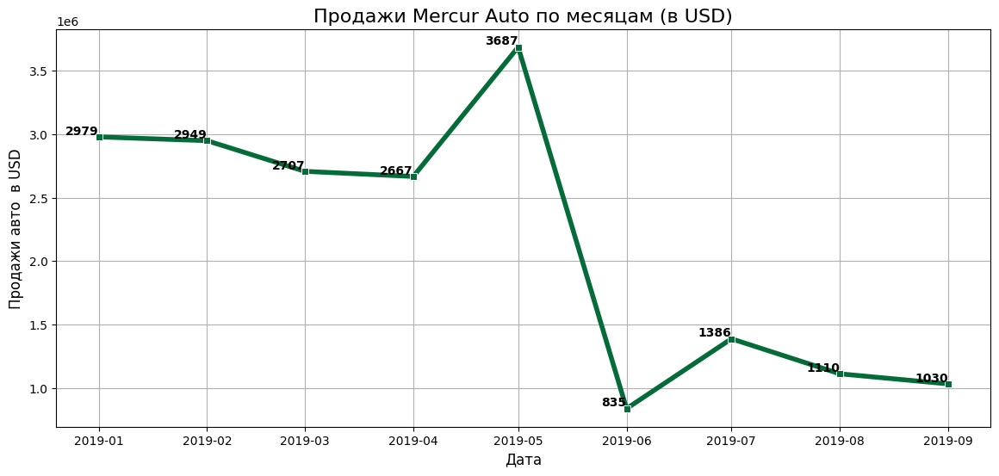

In [674]:
sns.set_palette('YlGn_r')
plt.figure(figsize=(14,6))
plt.title("Продажи Mercur Auto по месяцам (в USD)",  fontsize = 16)
sns.lineplot(data=mercur_sales, x="sales_data", y="sell_price_usd", markers=True, dashes=False, linewidth=4, marker="s")

for x, y, tex in zip(mercur_sales.sales_data, mercur_sales.sell_price_usd, mercur_sales.sell_price_usd):
    t = plt.text(x, y, int(tex/1000),
                 horizontalalignment='right',
                 rotation='horizontal',
                 verticalalignment='bottom',
                 fontdict={'color':'black', 'weight':'bold'})


plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Продажи авто  в USD',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

Стабильные продажи с января по май включительно. В июне резко снижение. Проверим причину, посмотрим на продажи по брендам.

In [675]:
mercur_sales_b = mercur.groupby(['brand', 'sales_data'])['sell_price_usd'].sum().reset_index()

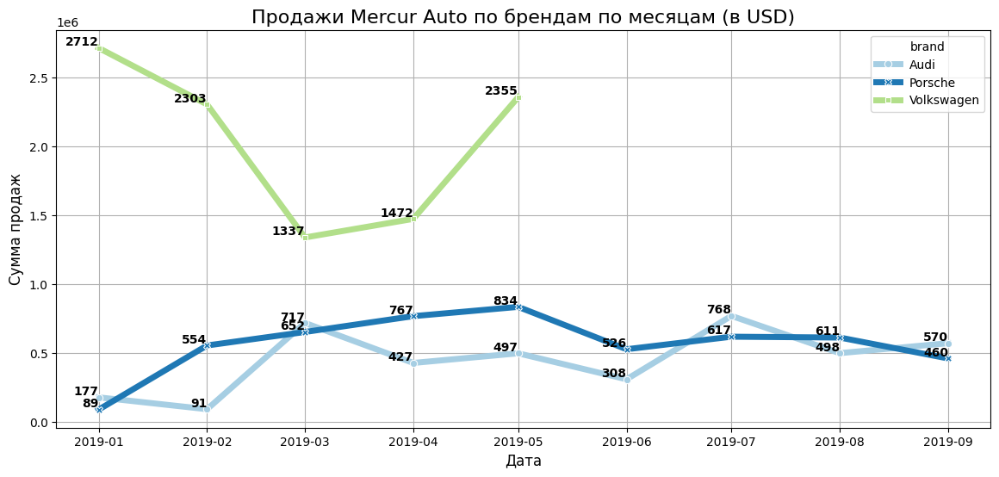

In [676]:
sns.set_palette('Paired')
plt.figure(figsize=(14,6))
plt.title("Продажи Mercur Auto по брендам по месяцам (в USD)",  fontsize = 16)
sns.lineplot(data=mercur_sales_b, x="sales_data", y="sell_price_usd", hue="brand", style="brand",\
             markers=True, dashes=False, linewidth=5)

for x, y, tex in zip(mercur_sales_b.sales_data, mercur_sales_b.sell_price_usd, mercur_sales_b.sell_price_usd):
    t = plt.text(x, y, int(tex/1000),
                 horizontalalignment='right',
                 rotation='horizontal',
                 verticalalignment='bottom',
                 fontdict={'color':'black', 'weight':'bold'})


plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Сумма продаж',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

Нашли причину резкого понижения выручки - с июня 2019 года Mercur Auto не продают автомобили бренда Volkswagen. Mercur Auto являлся официальным дилером марки Volkswagen в Казахстане, и приносила компании половину дохода. Причин прекращения продаж марки может быть несколько:
1) вероятно менеджеры дилерского центра превысили план продаж на год и автомобили бренда Volkswagen были проданы в первую половину года. Производитель не готов поставить дополнительное количество автомобилей;

2) Volkswagen приостановил сотрудничество с автоцентром, что сомнительно, так как  Porsche и Audi по прежнему продавались в автоцентре.


По данным [сайта](https://kz.kursiv.media/2018-07-30/volkswagen-group-rus-vyshla-na-rynok-kazakhstana/)

В 2018 году на территории Казахстана автомобили марок Volkswagen представлены в дилерских центрах: Mercur Auto (Алматы, Астана, Атырау), AutoMir Center (Караганда), AutoDom Motors (Костанай) и Eurasia Motor Zhaik (Уральск). Проверим продажи Volkswagen в компаниях.

In [677]:
volkswagen = auto.query('brand == "Volkswagen"').groupby(['company', 'sales_data'])['sell_price_usd'].sum().reset_index()

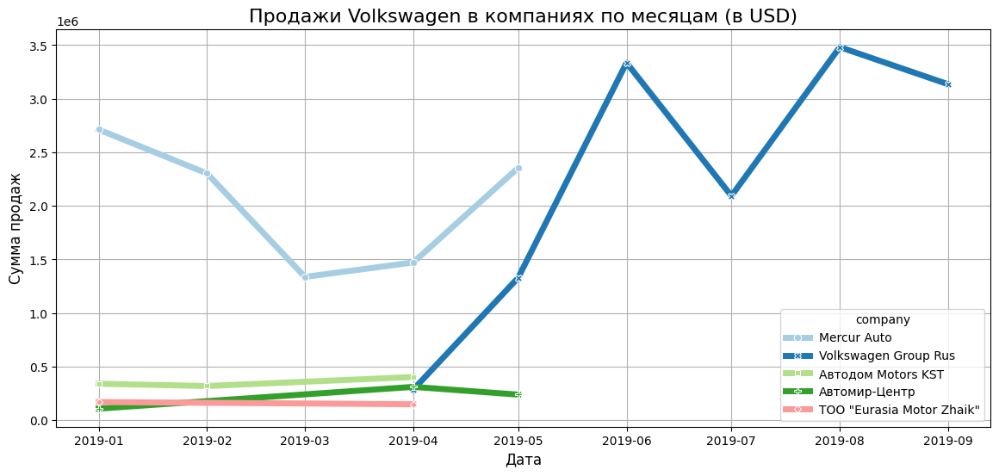

In [678]:
sns.set_palette('Paired')
plt.figure(figsize=(14,6))
plt.title("Продажи Volkswagen в компаниях по месяцам (в USD)",  fontsize = 16)
sns.lineplot(data=volkswagen, x="sales_data", y="sell_price_usd", hue="company", style="company",\
             markers=True, dashes=False, linewidth=5)

plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Сумма продаж',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

Наше 2 предположение оказалось практически верным. Volkswagen Group приостановил поставку автомобиля бренда Volkswagen для своих дилеров и с апреля 2019 года стал самостоятельно реализовывать данную марку на территории Казахстана.

In [679]:
# посмотрим продажи по регионам
mercur_state = mercur.groupby('state')['sell_price_usd'].sum().sort_values(ascending=False).reset_index()

In [680]:
# построим график выручки по регионам

fig = go.Figure(data=[go.Bar(x = mercur_state['state'], y = mercur_state['sell_price_usd'], marker_color='green')])
fig.update_layout(
                  title="Продажи Mercur Auto в регионах (в USD)",
                  xaxis_title="Регионы",
                  yaxis_title="Продажи авто  в USD",
                  height=500,
                  width=1000)
fig.show()



![Продажи Mercur Auto в регионах (в USD)](14.png)

*Комментарий*

Основной рынок продаж г. Алматы - 15 389 449.83 долларов, на втором месте - г. Нур-Султан - 1 639 059.14 долларов, третье место Костанайская область - 803 347.62 долларов. Примерно 90 процентов продаж осуществляется в крупных городах Казахстана.

Посмотрим продажи Mercur Auto в регионах по брендам.

In [681]:
mercur_reg_sale = (
    mercur.groupby(['state', 'brand'])['sell_price_usd'].sum().reset_index()
    .pivot_table(index='state', columns='brand', values='sell_price_usd', fill_value=0)
)

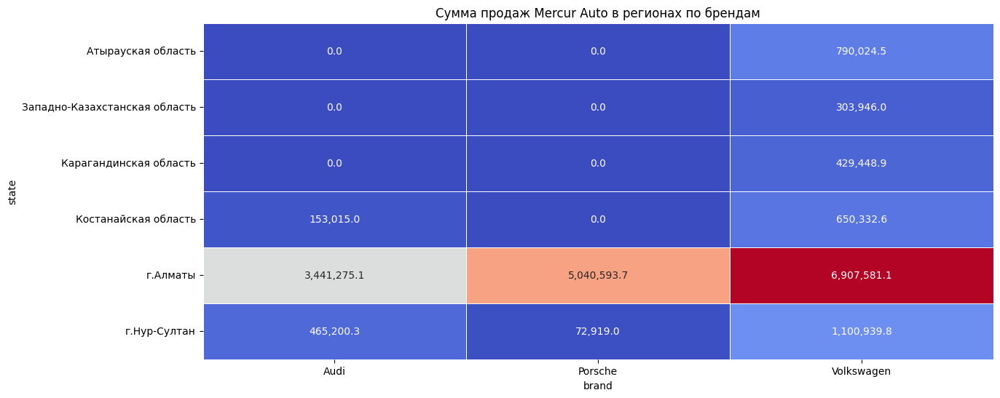

In [705]:
plt.figure(figsize=(14,6))
plt.title("Сумма продаж Mercur Auto в регионах по брендам")
sns.heatmap(mercur_reg_sale, annot=True, linewidth=.5, fmt = ",.1f", cbar=False, cmap='coolwarm')
plt.show()

*Комментарий*

Алматы продает около 80 % автомобилей компании. Volkswagen представлен во всех регионах, Audi в двух крупных городах и Костанайской области. Porsche только в Алматы и Нур-Султан.

Средняя цена продажи авто в динамике

In [683]:
mercur_mean_sales = mercur.groupby('sales_data').sell_price_usd.mean().round(2) \
.reset_index().rename(columns={'sell_price_usd':'mean_price_usd'})

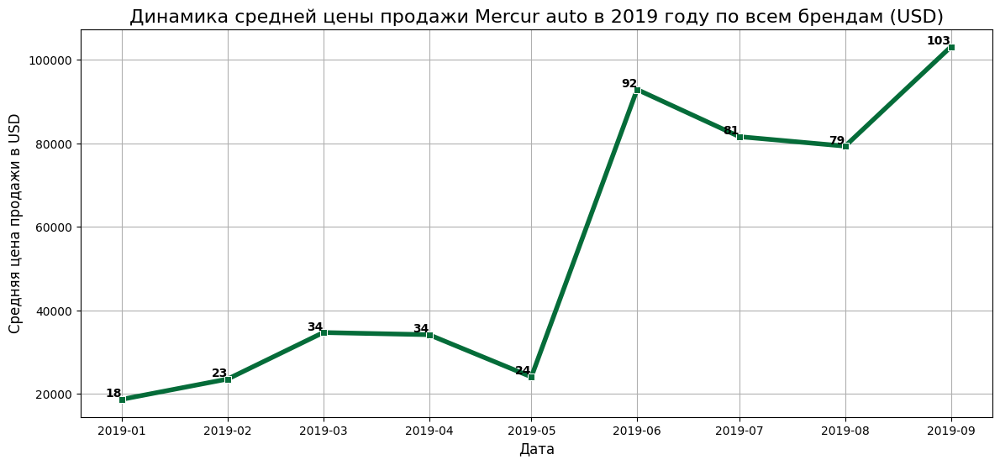

In [684]:
sns.set_palette('YlGn_r')
plt.figure(figsize=(14,6))
plt.title("Динамика средней цены продажи Mercur auto в 2019 году по всем брендам (USD)",  fontsize = 16)
sns.lineplot(data=mercur_mean_sales, x="sales_data", y="mean_price_usd", markers=True, dashes=False, linewidth=4, marker="s")

for x, y, tex in zip(mercur_mean_sales.sales_data, mercur_mean_sales.mean_price_usd, mercur_mean_sales.mean_price_usd):
    t = plt.text(x, y, int(tex/1000),
                 horizontalalignment='right',
                 rotation='horizontal',
                 verticalalignment='bottom',
                 fontdict={'color':'black', 'weight':'bold'})


plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Средняя цена продажи в USD',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

В июне наблюдаем пик повышения средней цены автомобилей компании, это связанно с прекращением продажи бренда Volkswagen. В продажи остались премиальный бренды:  Audi (78 067 тыс.), Porsche (98 336 тыс.)

In [685]:
brand_means = mercur.groupby(['sales_data', 'brand']).sell_price_usd.mean().round(2).reset_index()

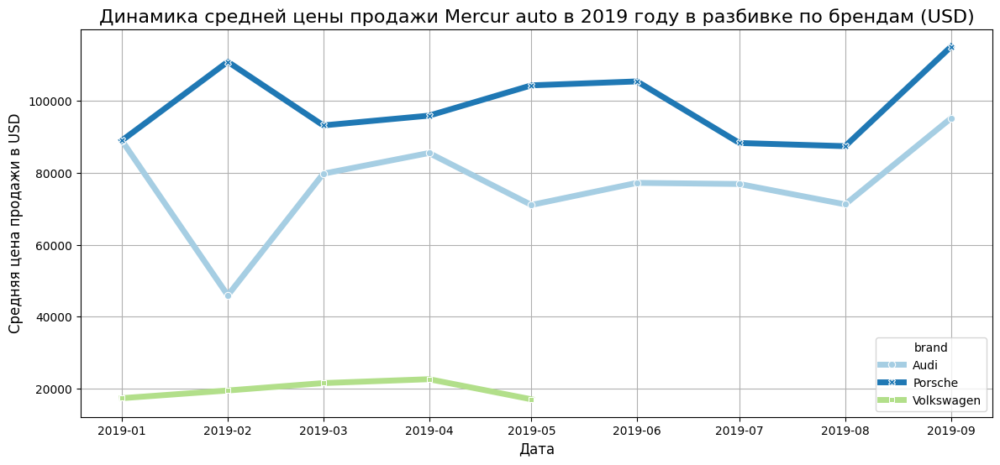

In [686]:
sns.set_palette('Paired')
plt.figure(figsize=(14,6))
plt.title("Динамика средней цены продажи Mercur auto в 2019 году в разбивке по брендам (USD)",  fontsize = 16)
sns.lineplot(data=brand_means, x="sales_data", y="sell_price_usd", hue="brand", style="brand",\
             markers=True, dashes=False, linewidth=5)

plt.xlabel('Дата',  fontsize = 12)
plt.ylabel('Средняя цена продажи в USD',  fontsize = 12)
plt.grid(True)
plt.show()

*Комментарий*

На графике видно, что среднюю цену продаж автомобилей в компании оттягивал в низ бренд Volkswagen.

#### **Вывод**


- Mercur Auto продает три бренда: Audi, Porsche, Volkswagen.

- Выручка Mercur Auto составила - 19355275.98 долларов
- Количество проданных авто Mercur Auto составило - 650 шт
- Доля выручка Mercur Auto составила - 1.43 %
- Доля продаж авто Mercur Auto составила - 1.21 %

- Средняя цена продажи авто по всем брендам - 30 101.52 долларов.
- Половину выручки компания получает от бренда Volkswagen.
- Самый дорогой брен компании - Porsche.

- В июне резко снижение продаж компании.
- Причина: Volkswagen Group приостановил поставку автомобиля бренда Volkswagen для своих дилеров и с апреля 2019 года стал самостоятельно реализовывать данную марку на территории Казахстана.

- Основной рынок продаж г. Алматы - 15 389 449.83 долларов, на втором месте - г. Нур-Султан - 1 639 059.14 долларов, третье место Костанайская область - 803 347.62 долларов.

### Конкурентный анализ

In [687]:
# найдем количество конкурентов Mercur Auto в регионах продаж

competitor = []


for reg in mercur['state'].unique():
    subset_auto = auto[auto['state'] == reg]
    unique_companies = subset_auto['company'].unique()
    competitor.extend(unique_companies)

    print(reg + ':', subset_auto['company'].nunique(), unique_companies)
    print()

г.Алматы: 26 ['Mercur Auto' 'Автоцентр-Бавария' 'БИПЭК АВТО' 'Вираж'
 'Eurasia Motor Premium' 'СемАЗ' 'Astana Motors'
 'Hyundai Com Trans Kazakhstan' 'Nissan Manufacturing RUS' 'СВС-ТРАНС'
 'Allur Auto' 'Almaty Motors Premium' 'ТК КАМАЗ' 'Toyota Motor Kazakhstan'
 'Лифан Моторс Рус' 'MAN Truck & Bus Kazakhstan' 'Autokapital' 'MMC RUS'
 'УзАвто-Казахстан' 'Ravon Motors Kazakstan' 'Renault Россия'
 'Scania Central Asia' 'Subaru Kazakhstan' 'Volkswagen Group Rus'
 'Scandinavian Motors' 'Hino Motors']

г.Нур-Султан: 20 ['Mercur Auto' 'Автоцентр-Бавария' 'БИПЭК АВТО' 'Вираж' 'Astana Motors'
 'Nissan Manufacturing RUS' 'Allur Auto' 'TERRA MOTORS' 'ТК КАМАЗ'
 'Toyota Motor Kazakhstan' 'Лифан Моторс Рус' 'Автомир ГК' 'Autokapital'
 'MMC RUS' 'УзАвто-Казахстан' 'Ravon Motors Kazakstan' 'Renault Россия'
 'Subaru Kazakhstan' 'Volkswagen Group Rus' 'СемАЗ']

Костанайская область: 19 ['Автоцентр-Бавария' 'БИПЭК АВТО' 'Вираж' 'Astana Motors' 'Allur Auto'
 'ТК КАМАЗ' 'Toyota Motor Kazakhstan' 'Лифан 

In [688]:
# посмотрим частоту встречаемости
Counter(competitor).most_common()

[('Mercur Auto', 6),
 ('БИПЭК АВТО', 6),
 ('Вираж', 6),
 ('Astana Motors', 6),
 ('Nissan Manufacturing RUS', 6),
 ('ТК КАМАЗ', 6),
 ('Toyota Motor Kazakhstan', 6),
 ('Лифан Моторс Рус', 6),
 ('MMC RUS', 6),
 ('УзАвто-Казахстан', 6),
 ('Ravon Motors Kazakstan', 6),
 ('Renault Россия', 6),
 ('Subaru Kazakhstan', 6),
 ('Volkswagen Group Rus', 6),
 ('СемАЗ', 5),
 ('Allur Auto', 5),
 ('Автоцентр-Бавария', 4),
 ('Autokapital', 4),
 ('Автомир ГК', 2),
 ('Eurasia Motor Premium', 1),
 ('Hyundai Com Trans Kazakhstan', 1),
 ('СВС-ТРАНС', 1),
 ('Almaty Motors Premium', 1),
 ('MAN Truck & Bus Kazakhstan', 1),
 ('Scania Central Asia', 1),
 ('Scandinavian Motors', 1),
 ('Hino Motors', 1),
 ('TERRA MOTORS', 1),
 ('Автодом Motors KST', 1),
 ('Daewoo Bus Kazakhstan', 1),
 ('Caspian Motors', 1),
 ('Автомир-Центр', 1),
 ('ТОО "Eurasia Motor Zhaik"', 1)]

*Комментарий*

Лидер по количеству автоцентров - г.Алматы: 26, второе место - г.Нур-Султан: 20, третье место разделяют - Костанайская область: 19 и Атырауская область: 19, четвертое место - Карагандинская область: 18, пятое место - Западно-Казахстанская область: 16.

В этих областях встречаются конкуренты Mercur Auto: БИПЭК АВТО, Вираж, Astana Motors, Nissan Manufacturing RUS, ТК КАМАЗ, Toyota Motor Kazakhstan, Лифан Моторс Рус, MMC RUS, УзАвто-Казахстан, Ravon Motors Kazakstan, Renault Россия, Subaru Kazakhstan, Volkswagen Group Rus.

Ранее мы нашли ещё 4 компании, котрые продают марку Volkswagen. Проверим по всем брендам.

In [689]:
competitor_brand = auto[auto['brand'].isin(mercur_brands)]['company'].unique()

In [690]:
for r in competitor_brand:
    print(r, ':', *auto.query('company == @r')['brand'].unique())

Mercur Auto : Audi Porsche Volkswagen
Volkswagen Group Rus : Volkswagen
Автодом Motors KST : Volkswagen
Автомир-Центр : Volkswagen
ТОО "Eurasia Motor Zhaik" : Volkswagen


*Комментарий*

Для бренда Volkswagen получили те же компании, что находили ранее.  А вот бренды Audi, Porsche  Mercur Auto поставляет эксклюзивно.

Посмотрим конкурентов по классификации авто.

In [691]:
class_mercur = mercur.class_2013.unique().tolist()

In [692]:
state_mercur = mercur.state.unique().tolist()

In [693]:
group = auto[auto['state'].isin(state_mercur) & auto['class_2013'].isin(class_mercur)]

In [694]:
group_c = group.groupby(['state', 'class_2013']).agg({'quantity':'sum', 'sell_price_usd': 'mean',\
                                                      'company':'nunique','model': 'nunique'}).reset_index()

In [695]:
q_group = group_c.query('class_2013 in @class_mercur').pivot_table(index='class_2013', columns='state',\
                                                                      values='quantity', fill_value=0)

s_group = group_c.query('class_2013 in @class_mercur').pivot_table(index='class_2013', columns='state',\
                                                                      values='sell_price_usd', fill_value=0)

c_group = group_c.query('class_2013 in @class_mercur').pivot_table(index='class_2013', columns='state',\
                                                                      values='company', fill_value=0)

m_group = group_c.query('class_2013 in @class_mercur').pivot_table(index='class_2013', columns='state',\
                                                                      values='model', fill_value=0)


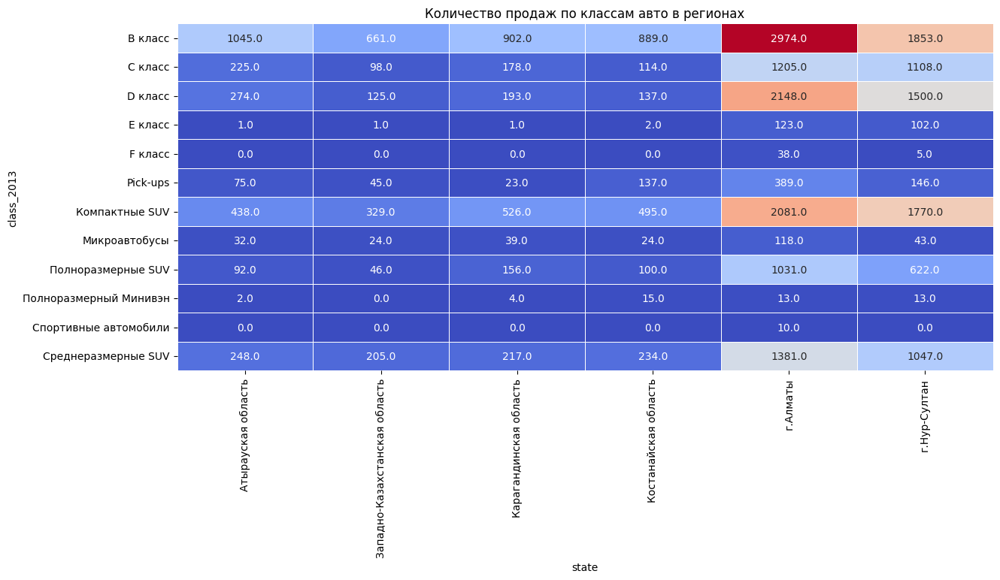

In [696]:
plt.figure(figsize=(14,6))
plt.title("Количество продаж по классам авто в регионах")
sns.heatmap(q_group, annot=True, linewidth=.5, fmt = ".1f", cbar=False, cmap='coolwarm')
plt.show()

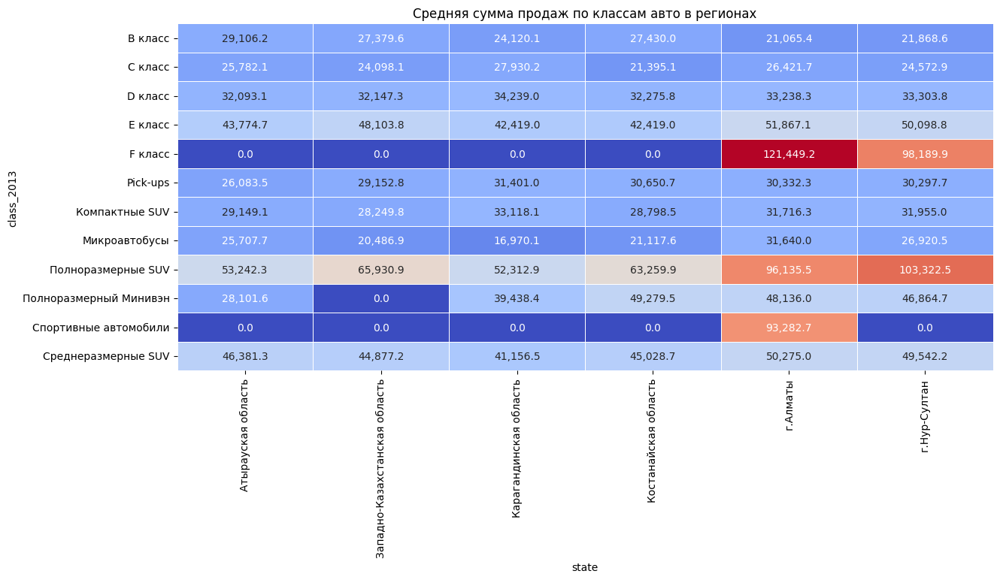

In [706]:
plt.figure(figsize=(14,6))
plt.title("Средняя сумма продаж по классам авто в регионах")
sns.heatmap(s_group, annot=True, linewidth=.5, fmt = ",.1f", cbar=False, cmap='coolwarm')
plt.show()

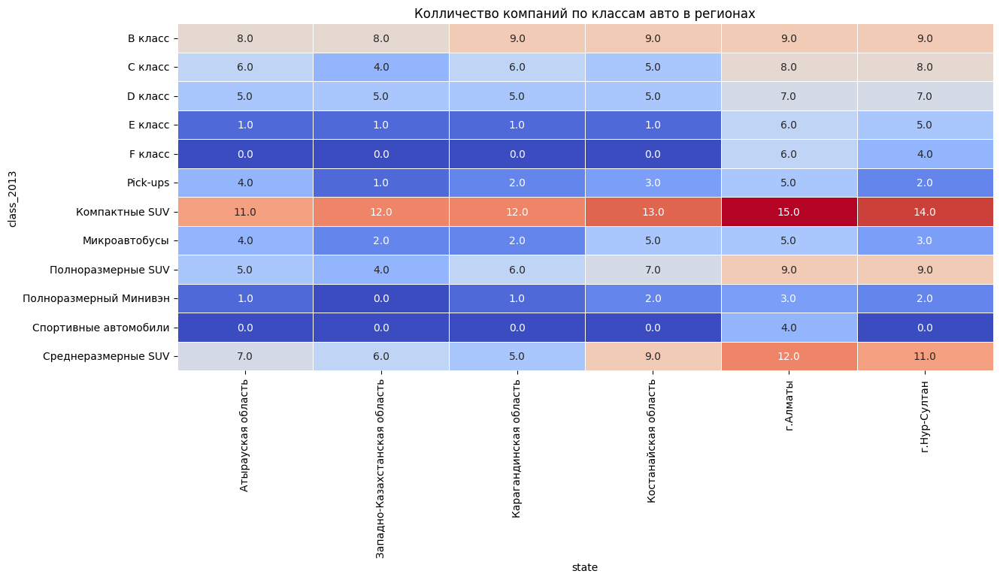

In [698]:
plt.figure(figsize=(14,6))
plt.title("Колличество компаний по классам авто в регионах")
sns.heatmap(c_group, annot=True, linewidth=.5, fmt = ".1f", cbar=False, cmap='coolwarm')
plt.show()

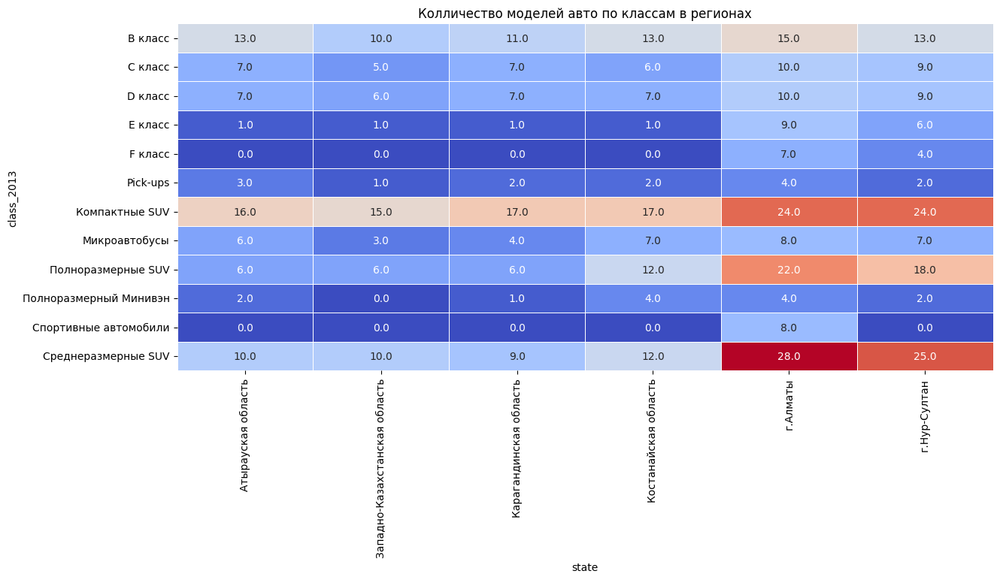

In [699]:
plt.figure(figsize=(14,6))
plt.title("Колличество моделей авто по классам в регионах")
sns.heatmap(m_group, annot=True, linewidth=.5, fmt = ".1f", cbar=False, cmap='coolwarm')
plt.show()

*Комментарий*

Лучшая ёмкость продажи в г. Алматы: B, С, D классы и  компактные/полноразмерные/среднразмерные SUV, г. Нур-Султан аналогично г. Алматы. Во всех регионах хорошо продаются авто: B класса и компактные SUV.

Лучшие направления по средней стоимости продаж: г. Алматы - F, Е классы, спортивные автомобили и полноразмерные/среднеразмерные SUV; г. Нур-Султан - полноразмерные SUV и F, Е классы. Во всех регионах хорошие показатели средей суммы продаж у полноразмерные SUV и E класс.

Высокая конкуреция во всех регионах у классов: компактные SUV, среднеразмерные SUV, B класс.

Наилучшая представленность моделей: во всех регионах - среднеразмерные SUV, компактные SUV, B класс; г. Алматы - все виды SUV и B, С, D классы; г. Нур-Султан - аналогично г. Алматы.

Найдем классы авто бренда Volkswagen который был представлен в Mercur Auto

In [700]:
volkswagen_m = mercur.query('brand == "Volkswagen"')

In [701]:
volkswagen_m_c = volkswagen_m.pivot_table(index='class_2013', columns='state', values='sell_price_usd', fill_value=0)


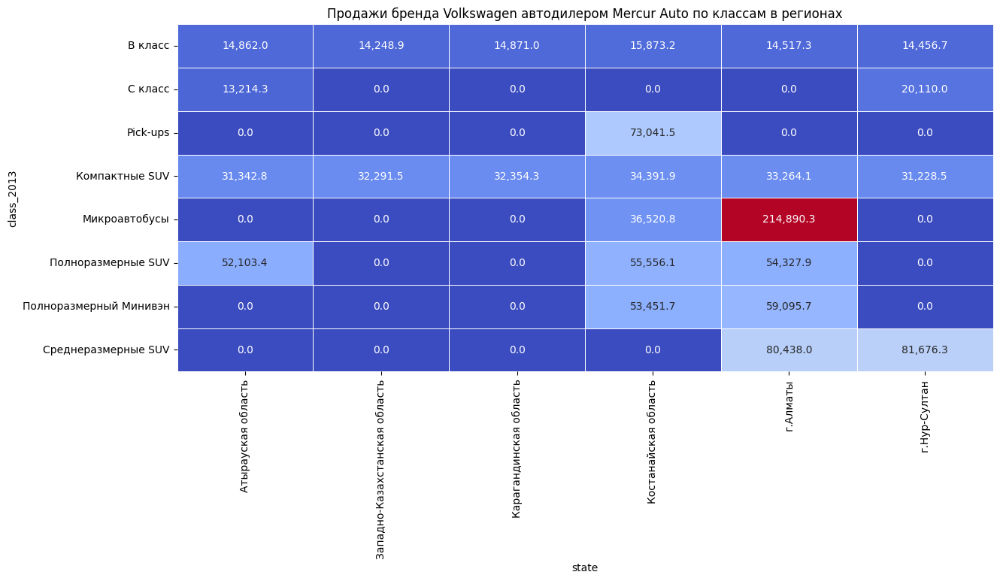

In [707]:
plt.figure(figsize=(14,6))
plt.title("Продажи бренда Volkswagen автодилером Mercur Auto по классам в регионах")
sns.heatmap(volkswagen_m_c, annot=True, linewidth=.5, fmt = ",.1f", cmap='coolwarm', cbar=False)
plt.show()

*Комментарий*

Лучшие продажи бренда Volkswagen в Mercur Auto были у классов: г. Алматы - микроавтобусы и среднеразмерный SUV; г. Нур-Султан - среднеразмерный SUV;  Костанайская область - pick-ups. По всем областям стабильные продажи - компактный SUV.

#### Вывод


- Лидер по количеству автоцентров - г.Алматы: 26
- Конкуренты Mercur Auto: БИПЭК АВТО, Вираж, Astana Motors, Nissan Manufacturing RUS, ТК КАМАЗ, Toyota Motor Kazakhstan, Лифан Моторс Рус, MMC RUS, УзАвто-Казахстан, Ravon Motors Kazakstan, Renault Россия, Subaru Kazakhstan, Volkswagen Group Rus.

- Mercur Auto поставляет эксклюзивно бренды Audi, Porsche

- Лучшая ёмкость продажи в г. Алматы: B, С, D классы и компактные/полноразмерные/среднразмерные SUV, г. Нур-Султан аналогично г. Алматы. Во всех регионах хорошо продаются авто: B класса и компактные SUV.

- Лучшие направления по средней стоимости продаж: г. Алматы - F, Е классы, спортивные автомобили и полноразмерные/среднеразмерные SUV; г. Нур-Султан - полноразмерные SUV и F, Е классы. Во всех регионах хорошие показатели средей суммы продаж у полноразмерные SUV и E класс.

- Высокая конкуреция во всех регионах у классов: компактные SUV, среднеразмерные SUV, B класс.

- Наилучшая представленность моделей: во всех регионах - среднеразмерные SUV, компактные SUV, B класс; г. Алматы - все виды SUV и B, С, D классы; г. Нур-Султан - аналогично г. Алматы.

- Лучшие продажи бренда Volkswagen в Mercur Auto были у классов: г. Алматы - микроавтобусы и среднеразмерный SUV; г. Нур-Султан - среднеразмерный SUV; Костанайская область - pick-ups. По всем областям стабильные продажи - компактный SUV.

## Общий вывод


- Наиболее продаваемые авто с типом топлива Бензин - 94% и дизель - 5%.
- За 9 месяце 2019 года в Казахстане было продано 39 965 автомобилей стоимостью - 1 349 194 556.31 долларов.
- Сегмент коммерческого авто составляет - 13.8%, некоммерческого авто - 86.2% от общего объема.
- Лидер продаж в коммерческом секторе - Kamaz 28.4%, Gaz 19.9%, Ankai 17.8%
- Лидер продаж в некоммерческом секторе - Toyota 40%, Hyundai 22.8%, Lada 10.7%
- Наиболее популярны внедорожники и легковые автомобили. Во внедорожниках лидиреут кроссовер Hyundai Tucson. Лидером легковых автомобилей стал представитель седанов среднего класса -Toyota Camry.
- По объему двигателя основу продаж состаляют среднелитражные автомобили, малолитражные, крупнолитражные. В крупнолитражных лидирует джип Toyota LC200, у среднелитражных на первом месте седан Toyota Camry, в малолитражных лидер продаж - Hyundai Accent.
- Лидер продаж по брендам - Toyota, на втором месте - Hyundai, третье место у Lada.
- Лидер продаж по компаниям - Toyota Motor Kazakhstan. Второе место - Astana Motors. Третье место - БИПЭК АВТО.
- В коммерческом секторе самым дорогим авто является автобус бренда Nefaz, грузовики MAN, автобусы ANKAI.    
- В некомерческом секторе самое дорогое авто - внедорожник у бренда Land Rover, далее автомобили бренда Mercedes-Benz и автомобили бренда Porsche.
- Основные продажи осуществляются в г. Алматы и Нур-Султан, там же находится наиболшее количество автоцентров.
- Была проверена гипотеза. Отвергли нулевую гипотезу. Средняя стоимость покупаемого автомобиля в регионе зависит от среднего дохода в регионе.



- Mercur Auto продает три бренда: Audi, Porsche, Volkswagen.
- Выручка Mercur Auto составила - 19 355 275.98 долларов
- Доля выручка Mercur Auto составила - 1.43 %
- Доля продаж авто Mercur Auto составила - 1.21 %
- Половину выручки компания получает от бренда Volkswagen.
- Самый дорогой брен компании - Porsche.
- Причина снижения продаж с июня 2019 года: Volkswagen Group приостановил поставку автомобиля бренда Volkswagen для своих дилеров и с апреля 2019 года стал самостоятельно реализовывать данную марку на территории Казахстана.
- Основной рынок продаж г. Алматы - 15 389 449.83 долларов, г. Нур-Султан - 1 639 059.14 долларов, Костанайская область - 803 347.62 долларов.


- Конкуренты Mercur Auto: БИПЭК АВТО, Вираж, Astana Motors, Nissan Manufacturing RUS, ТК КАМАЗ, Toyota Motor Kazakhstan, Лифан Моторс Рус, MMC RUS, УзАвто-Казахстан, Ravon Motors Kazakstan, Renault Россия, Subaru Kazakhstan, Volkswagen Group Rus.
- Лучшие продажи бренда Volkswagen в Mercur Auto были у классов: г. Алматы - микроавтобусы и среднеразмерный SUV; г. Нур-Султан - среднеразмерный SUV; Костанайская область - pick-ups. По всем областям стабильные продажи - компактный SUV.


**Рекомендации**

Компании Mercur Auto стоит рассмотреть другие бренды, как варианты замены классов авто, ушедшего от них с июня Volkswagen. Рекомендую отдать предпочтение автомобилям на бензиновом или дизельном топливе. Рассмотреть вариант увеличени продаж классов: B, С, D классы и компактные/полноразмерные/среднразмерные SUV. Либо сконцентрироваться на премиальных автомобилях в дополнение к оставшимся брендам Audi, Porsche.

